# Guide
## Data
[[Google Drive] /Data/Final/Step2-2.zip](https://drive.google.com/file/d/19ARNrbgWSn-Wi5k7uXKehJnzmvbIRThv/view?usp=sharing)
## Code
In [3] `base_dir` : 실제 데이터 경로로 변경 필요  
In [9] `filepath` : 학습된 모델 저장할 경로로 변경 필요  
In [23] `save_dir` : Grad-CAM 이미지 저장할 경로로 변경 필요  
## Result
- Model  
[[Google Drive] /Final_Model/Step2_Model.h5](https://drive.google.com/file/d/1o2StU0RmsKOoI4qIGtVYav0gyEJx7Dom/view?usp=sharing)  
- Grad-CAM  
[[Google Drive] /Grad-CAM/Step2.zip](https://drive.google.com/file/d/1sp6pIuaYz1wFHue2DDwepp6ILArvtTcw/view?usp=sharing)
---

# Purpose
- Step2 최종 모델 저장  
- 모델 성능 평가

## Alternation
(compared to `6. ImageSize_224`)  
- 학습된 모델 저장  
- Confusion Matrix 출력  
- 잘못 분류한 테스트 데이터에 대한 Grad-CAM 출력 및 저장

In [1]:
from tensorflow import keras
from tensorflow.keras import layers, optimizers
import os

2024-11-24 13:17:58.499114: I tensorflow/core/platform/cpu_feature_guard.cc:182] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.


In [2]:
image_size = (224, 224)
batch_size = 32

In [3]:
# 데이터셋 로드
from tensorflow.keras.utils import image_dataset_from_directory

# 실제 데이터의 경로로 변경 필요
base_dir = "/tf/Fixed_Data/Data_Final/Step2-2"

train_dataset = image_dataset_from_directory(
    os.path.join(base_dir, 'train'),
    image_size=image_size,
    batch_size=batch_size)

validation_dataset = image_dataset_from_directory(
    os.path.join(base_dir, 'validation'),
    image_size=image_size,
    batch_size=batch_size)

test_dataset = image_dataset_from_directory(
    os.path.join(base_dir, 'test'),
    image_size=image_size,
    batch_size=batch_size)

Found 11340 files belonging to 18 classes.
Found 3240 files belonging to 18 classes.
Found 1620 files belonging to 18 classes.


2024-11-24 13:18:00.157279: I tensorflow/compiler/xla/stream_executor/cuda/cuda_gpu_executor.cc:995] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysfs-bus-pci#L344-L355
2024-11-24 13:18:00.160584: I tensorflow/compiler/xla/stream_executor/cuda/cuda_gpu_executor.cc:995] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysfs-bus-pci#L344-L355
2024-11-24 13:18:00.160672: I tensorflow/compiler/xla/stream_executor/cuda/cuda_gpu_executor.cc:995] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysf

In [4]:
# 모델 레이어 구성
inputs = keras.Input(shape=(224, 224, 3))

x = layers.Rescaling(1./255)(inputs)

x = layers.Conv2D(filters=32, kernel_size=3)(inputs)
x = layers.BatchNormalization()(x)
x = layers.ReLU()(x)
x = layers.MaxPooling2D(pool_size=2)(x)

x = layers.Conv2D(filters=64, kernel_size=3)(x)
x = layers.BatchNormalization()(x)
x = layers.ReLU()(x)
x = layers.MaxPooling2D(pool_size=2)(x)

x = layers.Conv2D(filters=128, kernel_size=3)(x)
x = layers.BatchNormalization()(x)
x = layers.ReLU()(x)
x = layers.MaxPooling2D(pool_size=2)(x)

x = layers.Conv2D(filters=256, kernel_size=3)(x)
x = layers.BatchNormalization()(x)  
x = layers.Conv2D(filters=256, kernel_size=3)(x)   
x = layers.BatchNormalization()(x)
x = layers.ReLU()(x)
x = layers.MaxPooling2D(pool_size=2)(x)

x = layers.Conv2D(filters=512, kernel_size=3)(x)
x = layers.BatchNormalization()(x)
x = layers.ReLU()(x)
x = layers.Dropout(0.4)(x)
x = layers.MaxPooling2D(pool_size=2)(x)

x = layers.Flatten()(x)
x = layers.Dense(512, activation = "relu")(x)
x = layers.Dropout(0.4)(x)
x = layers.Dense(256, activation = "relu")(x)   

outputs = layers.Dense(18, activation="softmax")(x)

model = keras.Model(inputs=inputs, outputs=outputs)

In [5]:
model.summary()

Model: "model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_1 (InputLayer)        [(None, 224, 224, 3)]     0         
                                                                 
 conv2d (Conv2D)             (None, 222, 222, 32)      896       
                                                                 
 batch_normalization (Batch  (None, 222, 222, 32)      128       
 Normalization)                                                  
                                                                 
 re_lu (ReLU)                (None, 222, 222, 32)      0         
                                                                 
 max_pooling2d (MaxPooling2  (None, 111, 111, 32)      0         
 D)                                                              
                                                                 
 conv2d_1 (Conv2D)           (None, 109, 109, 64)      18496 

In [6]:
# 학습률 및 옵티마이저 설정
optimizer = optimizers.RMSprop(learning_rate=1e-4)

# 모델 컴파일
model.compile(optimizer=optimizer,
              loss='sparse_categorical_crossentropy',
              metrics=['accuracy'])

In [7]:
from tensorflow.keras.callbacks import EarlyStopping

# EarlyStopping 콜백 설정
early_stopping = EarlyStopping(
    monitor='val_loss',       # 검증 손실을 기준으로 학습 중단
    patience=5,               # 성능이 개선되지 않는 에포크 수 (5회 연속 개선 없을 시 중단)
    restore_best_weights=True # 최적의 가중치 복원
)

In [8]:
reduce_LR_on_plateau = keras.callbacks.ReduceLROnPlateau(
    monitor='val_loss',   # 검증 손실 기준
    factor=0.5,           # 학습률 절반으로 감소
    patience=3            # 3회 연속 개선 없을 경우
)

## Save Step2 Final Model
`ModelCheckpoint` 콜백 사용 → val_loss가 개선된 매 Epoch마다 모델 저장  

## Saved Model
[[Google Drive] /Final_Model/Step2_Model.h5](https://drive.google.com/file/d/1o2StU0RmsKOoI4qIGtVYav0gyEJx7Dom/view?usp=sharing)

### Source : 교재 코드 8-11

In [9]:
callbacks = [
    keras.callbacks.ModelCheckpoint(
        filepath="/tf/Final/Step2_Model.h5",   # 모델 저장 경로 변경 필요
        save_best_only=True,   # val_loss가 개선될 때만 저장
        monitor="val_loss"
    ),
    early_stopping,
    reduce_LR_on_plateau
]

In [10]:
history = model.fit(
    train_dataset,
    validation_data=validation_dataset,
    epochs=100,
    callbacks=callbacks,   # ModelCheckpoint, EarlyStopping, ReduceLROnPlateau 설정
    batch_size=batch_size)

Epoch 1/100


2024-11-24 13:18:01.686536: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:954] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape inmodel/dropout/dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer
2024-11-24 13:18:02.251707: I tensorflow/compiler/xla/stream_executor/cuda/cuda_dnn.cc:432] Loaded cuDNN version 8600
2024-11-24 13:18:02.541950: I tensorflow/compiler/xla/stream_executor/cuda/cuda_blas.cc:606] TensorFloat-32 will be used for the matrix multiplication. This will only be logged once.
2024-11-24 13:18:02.560391: I tensorflow/compiler/xla/service/service.cc:168] XLA service 0x7fa43d5f2170 initialized for platform CUDA (this does not guarantee that XLA will be used). Devices:
2024-11-24 13:18:02.560412: I tensorflow/compiler/xla/service/service.cc:176]   StreamExecutor device (0): NVIDIA GeForce RTX 4090, Compute Capability 8.9
2024-11-24 13:18:02.563591: I tensorflow/compiler/mlir/tensorflow/utils/dump_mlir_util.cc:

355/355 [==============================] - 21s 49ms/step - loss: 1.6215 - accuracy: 0.4984 - val_loss: 1.2621 - val_accuracy: 0.5824 - lr: 1.0000e-04
Epoch 2/100


/usr/local/lib/python3.8/dist-packages/keras/src/engine/training.py:3000: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


355/355 [==============================] - 17s 46ms/step - loss: 1.0907 - accuracy: 0.6483 - val_loss: 0.9063 - val_accuracy: 0.6948 - lr: 1.0000e-04
Epoch 3/100
355/355 [==============================] - 17s 46ms/step - loss: 0.8880 - accuracy: 0.7122 - val_loss: 0.8197 - val_accuracy: 0.7364 - lr: 1.0000e-04
Epoch 4/100
355/355 [==============================] - 16s 45ms/step - loss: 0.7862 - accuracy: 0.7479 - val_loss: 0.7142 - val_accuracy: 0.7741 - lr: 1.0000e-04
Epoch 5/100
355/355 [==============================] - 16s 45ms/step - loss: 0.6814 - accuracy: 0.7763 - val_loss: 0.8708 - val_accuracy: 0.7170 - lr: 1.0000e-04
Epoch 6/100
355/355 [==============================] - 16s 45ms/step - loss: 0.6346 - accuracy: 0.7938 - val_loss: 0.6563 - val_accuracy: 0.7809 - lr: 1.0000e-04
Epoch 7/100
355/355 [==============================] - 16s 44ms/step - loss: 0.5722 - accuracy: 0.8089 - val_loss: 0.5771 - val_accuracy: 0.8182 - lr: 1.0000e-04
Epoch 8/100
355/355 [===================

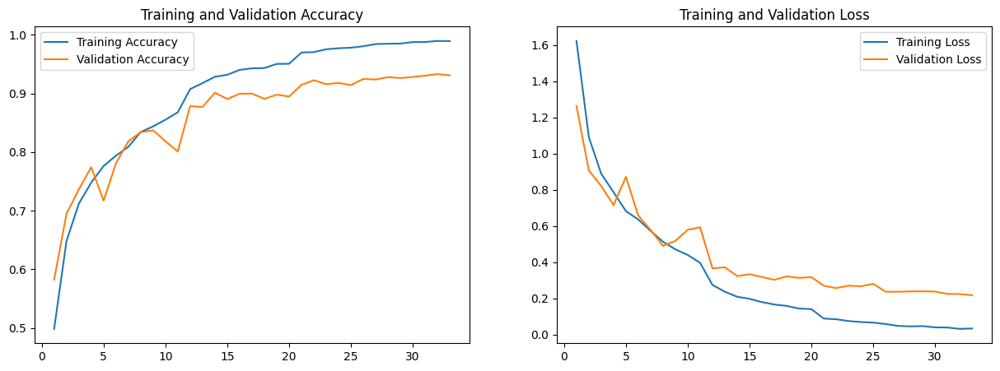

In [11]:
# 훈련 정확도와 손실 그래프 생성
import matplotlib.pyplot as plt 

acc = history.history['accuracy'][:-5]           
val_acc = history.history['val_accuracy'][:-5]   
loss = history.history['loss'][:-5]              
val_loss = history.history['val_loss'][:-5]      
epochs_range = range(1, len(acc) + 1)

plt.figure(figsize=(15, 5))
plt.subplot(1, 2, 1)
plt.plot(epochs_range, acc, label='Training Accuracy')
plt.plot(epochs_range, val_acc, label='Validation Accuracy')
plt.title('Training and Validation Accuracy')
plt.legend()

plt.subplot(1, 2, 2)
plt.plot(epochs_range, loss, label='Training Loss')
plt.plot(epochs_range, val_loss, label='Validation Loss')
plt.title('Training and Validation Loss')
plt.legend()

plt.show()

In [12]:
test_loss, test_acc = model.evaluate(test_dataset)

print(f"test accuracy: {test_acc}")
print(f"test loss: {test_loss}")

51/51 [==============================] - 2s 31ms/step - loss: 0.2360 - accuracy: 0.9272
test accuracy: 0.9271605014801025
test loss: 0.23595857620239258


# Confusion Matrix
## Code Source
[[IBM] Create a confusion matrix with Python](https://developer.ibm.com/tutorials/awb-confusion-matrix-python/#confusion-matrix-layout0)

In [13]:
import numpy as np
from sklearn import metrics
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score
from sklearn.metrics import classification_report
import seaborn as sns

In [14]:
# 테스트 데이터 로드
# shuffle=False
test_dataset = image_dataset_from_directory(
    os.path.join(base_dir, 'test'),
    image_size=image_size,
    batch_size=batch_size,
    shuffle=False)

Found 1620 files belonging to 18 classes.


In [15]:
true_labels = []
predictions = []

# 테스트 데이터 실제 라벨, 예측 클래스 저장
for images, labels in test_dataset:
    # 모델 예측
    preds = model.predict(images)  # 다중 클래스 확률 값 (각 클래스에 대한 확률)

    predicted_classes = np.argmax(preds, axis=1)  # 가장 높은 확률의 클래스 선택

    predictions.extend(predicted_classes)  # 예측 클래스 저장
    true_labels.extend(labels.numpy())  # 실제 라벨 저장

# 리스트 변환
predictions = np.array(predictions)
true_labels = np.array(true_labels)

1/1 [==============================] - 0s 113ms/step


In [16]:
# define confusion matrix
confusion_matrix = metrics.confusion_matrix(true_labels, predictions)

In [17]:
labels = ["Apple_Fresh",
         "Apple_Rotten",
         "Banana_Fresh",
         "Banana_Rotten",
         "Lemon_Fresh",
         "Lemon_Rotten",
         "Mango_Fresh",
         "Mango_Rotten",
         "Olive_Fresh",
         "Olive_Rotten",
         "Orange_Fresh",
         "Orange_Rotten",
         "Pomegranate_Fresh",
         "Pomegranate_Rotten",
         "Strawberry_Fresh",
         "Strawberry_Rotten",
         "Tomato_Fresh",
         "Tomato_Rotten"]

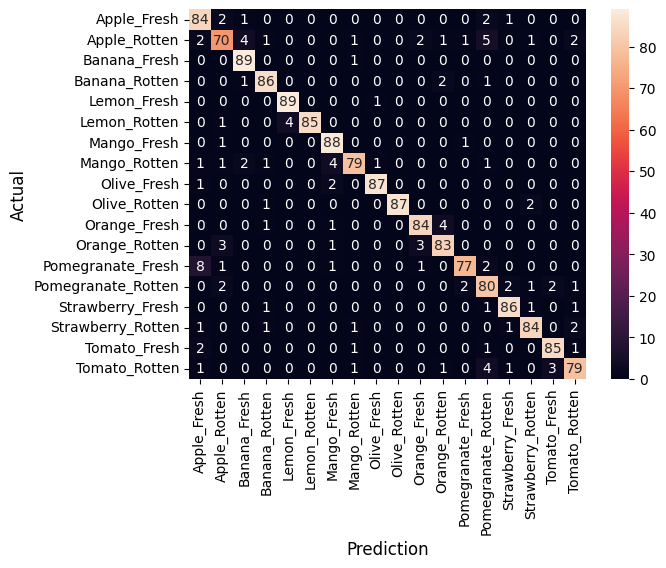

In [18]:
# define and print matrix with labels
sns.heatmap(confusion_matrix,
            annot=True,
            fmt='g',
            xticklabels=labels,
            yticklabels=labels)

# display matrix
plt.ylabel('Actual',fontsize=12)
plt.xlabel('Prediction',fontsize=12)
plt.show()

# Anlaysis - Confusion Matrix
- Apple_Rotten → Banana_Fresh  
- Apple_Rotten → Pomegranate_Rotten  
- Lemon_Rotten → Lemon_Fresh  
- Mango_Rotten → Mango_Fresh  
- Orange_Fresh → Orange_Rotten
- Orange_Rotten → Apple_Rotten  
- Orange_Rotten → Orange_Fresh  
- Pomegrante_Fresh → Apple_Fresh  
- Tomato_Rotten → Pomegranate_Rotten  
- Tomato_Rotten → Tomato_Fresh

---

# Grad-CAM
잘못 예측한 이미지의 Grad-CAM 출력 및 저장

## Code Source
[[keras] Grad-CAM class activation visualization](https://keras.io/examples/vision/grad_cam/)  

## Saved Image
[[Google Drive] /Grad-CAM/Step2.zip](https://drive.google.com/file/d/1sp6pIuaYz1wFHue2DDwepp6ILArvtTcw/view?usp=sharing)

In [19]:
import tensorflow as tf
from IPython.display import Image, display
import matplotlib as mpl

In [20]:
def get_img_array(img_path, size):
    
    # `img` is a PIL image of size 400x400
    img = keras.utils.load_img(img_path, target_size=size)
    
    # `array` is a float32 Numpy array of shape (400, 400, 3)
    array = keras.utils.img_to_array(img)
    
    # We add a dimension to transform our array into a "batch"
    # of size (1, 400, 400, 3)
    array = np.expand_dims(array, axis=0)
    return array

In [21]:
def make_gradcam_heatmap(img_array, model, last_conv_layer_name, pred_index=None):
    
    # First, we create a model that maps the input image to the activations
    # of the last conv layer as well as the output predictions
    grad_model = tf.keras.Model(
        inputs=model.input,
        outputs=[model.get_layer(last_conv_layer_name).output, model.output])


    # Then, we compute the gradient of the top predicted class for our input image
    # with respect to the activations of the last conv layer
    with tf.GradientTape() as tape:
        
        last_conv_layer_output, preds = grad_model(img_array)
        
        if pred_index is None:
            pred_index = tf.argmax(preds[0])
            
        class_channel = preds[:, pred_index]

    # This is the gradient of the output neuron (top predicted or chosen)
    # with regard to the output feature map of the last conv layer
    grads = tape.gradient(class_channel, last_conv_layer_output)

    # This is a vector where each entry is the mean intensity of the gradient
    # over a specific feature map channel
    pooled_grads = tf.reduce_mean(grads, axis=(0, 1, 2))

    # We multiply each channel in the feature map array
    # by "how important this channel is" with regard to the top predicted class
    # then sum all the channels to obtain the heatmap class activation
    last_conv_layer_output = last_conv_layer_output[0]
    heatmap = last_conv_layer_output @ pooled_grads[..., tf.newaxis]
    heatmap = tf.squeeze(heatmap)

    # For visualization purpose, we will also normalize the heatmap between 0 & 1
    heatmap = tf.maximum(heatmap, 0) / tf.math.reduce_max(heatmap)
    
    return heatmap.numpy()

In [22]:
def save_and_display_gradcam(img_path, heatmap, cam_path, alpha=0.4):
    
    # Load the original image
    img = keras.utils.load_img(img_path)
    img = keras.utils.img_to_array(img)

    # Rescale heatmap to a range 0-255
    heatmap = np.uint8(255 * heatmap)

    # Use jet colormap to colorize heatmap
    jet = mpl.colormaps["jet"]

    # Use RGB values of the colormap
    jet_colors = jet(np.arange(256))[:, :3]
    jet_heatmap = jet_colors[heatmap]

    # Create an image with RGB colorized heatmap
    jet_heatmap = keras.utils.array_to_img(jet_heatmap)
    jet_heatmap = jet_heatmap.resize((img.shape[1], img.shape[0]))
    jet_heatmap = keras.utils.img_to_array(jet_heatmap)

    # Superimpose the heatmap on original image
    superimposed_img = jet_heatmap * alpha + img
    superimposed_img = keras.utils.array_to_img(superimposed_img)

    # Save the superimposed image
    superimposed_img.save(cam_path)

    # Display Grad CAM
    display(Image(cam_path))
    print(f"Grad-CAM saved to: {cam_path}")

In [23]:
last_conv_layer_name = "conv2d_5"

save_dir = "/tf/Grad-CAM/Step2"   # Grad-CAM 이미지 저장 경로 변경 필요
test_dir = os.path.join(base_dir, 'test')

In [24]:
# 이미지 파일 경로 추출
file_paths = []
for root, _, files in os.walk(test_dir):
    for file in files:
        file_paths.append(os.path.join(root, file))

# 파일 경로 정렬 → 데이터셋 순서와 일치
file_paths.sort()

In [25]:
incorrect_files = []
incorrect_idx = []

for i in range(len(true_labels)):
    if true_labels[i] != predictions[i]:
        incorrect_files.append(file_paths[i])
        incorrect_idx.append(i)

real class : Apple_Fresh
predicted class : Pomegranate_Rotten


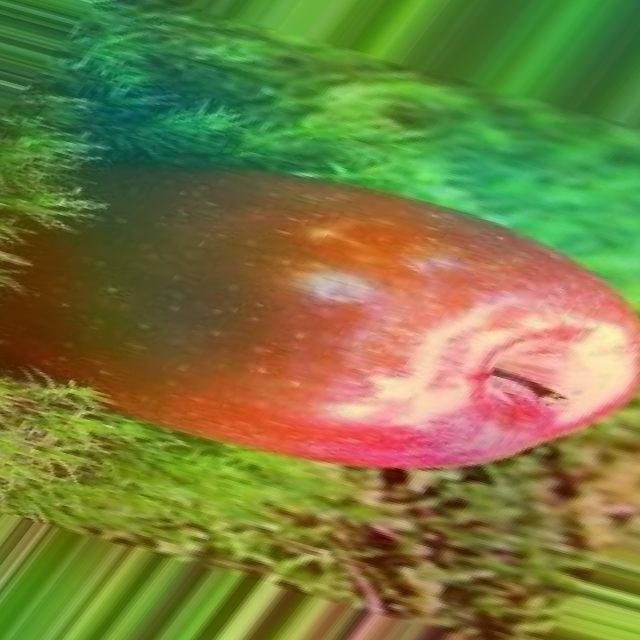

Grad-CAM saved to: /tf/Grad-CAM/Step2/Grad-CAM_0_'Apple_Fresh'_to_'Pomegranate_Rotten'.jpg
Original Image Path : /tf/Fixed_Data/Data_Final/Step2-2/test/Apple_Fresh/aug_-00071_jpeg_jpg_f6cef5a9-9b69-4e09-898d-1ddae0c8a667_0_9521.jpg

real class : Apple_Fresh
predicted class : Apple_Rotten


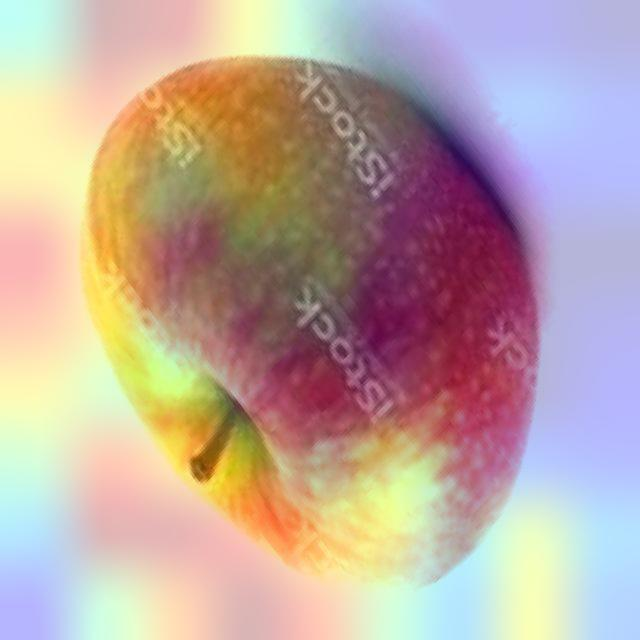

Grad-CAM saved to: /tf/Grad-CAM/Step2/Grad-CAM_1_'Apple_Fresh'_to_'Apple_Rotten'.jpg
Original Image Path : /tf/Fixed_Data/Data_Final/Step2-2/test/Apple_Fresh/aug_-00107_jpeg_jpg_e37bab27-cd75-4416-9fcf-23dcc7d683a9_0_6097.jpg

real class : Apple_Fresh
predicted class : Pomegranate_Rotten


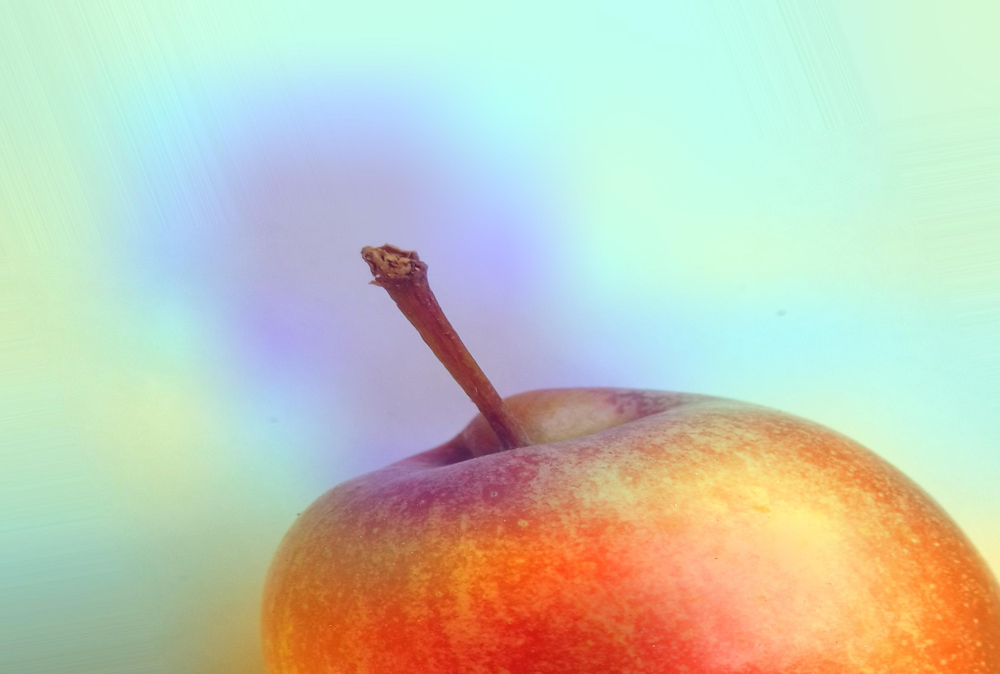

Grad-CAM saved to: /tf/Grad-CAM/Step2/Grad-CAM_2_'Apple_Fresh'_to_'Pomegranate_Rotten'.jpg
Original Image Path : /tf/Fixed_Data/Data_Final/Step2-2/test/Apple_Fresh/aug_FreshApple (198)_c01aa366-102e-488a-8cea-69d0fb6d1900_0_3171.jpg

real class : Apple_Fresh
predicted class : Apple_Rotten


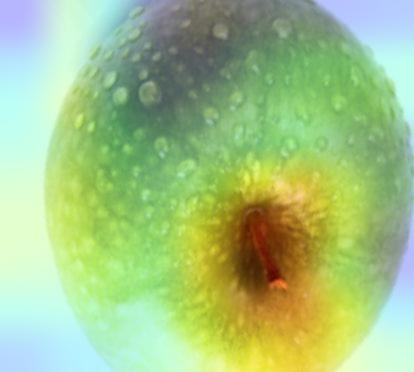

Grad-CAM saved to: /tf/Grad-CAM/Step2/Grad-CAM_3_'Apple_Fresh'_to_'Apple_Rotten'.jpg
Original Image Path : /tf/Fixed_Data/Data_Final/Step2-2/test/Apple_Fresh/aug_Screen Shot 2018-06-08 at 5_080d1a12-02bb-477f-9105-c597295eb602_0_6809.jpg

real class : Apple_Fresh
predicted class : Strawberry_Fresh


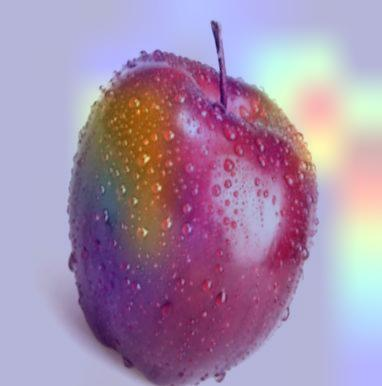

Grad-CAM saved to: /tf/Grad-CAM/Step2/Grad-CAM_4_'Apple_Fresh'_to_'Strawberry_Fresh'.jpg
Original Image Path : /tf/Fixed_Data/Data_Final/Step2-2/test/Apple_Fresh/aug_Screen Shot 2018-06-08 at 5_351b263d-49e6-4019-8046-1a2a60fbfbca_0_4029.jpg

real class : Apple_Fresh
predicted class : Banana_Fresh


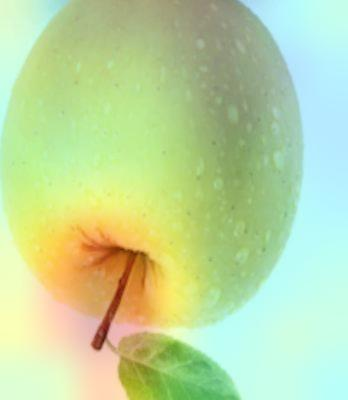

Grad-CAM saved to: /tf/Grad-CAM/Step2/Grad-CAM_5_'Apple_Fresh'_to_'Banana_Fresh'.jpg
Original Image Path : /tf/Fixed_Data/Data_Final/Step2-2/test/Apple_Fresh/aug_Screen Shot 2018-06-08 at 5_5fcac056-016f-473c-90ed-a990da26a0e7_0_4159.jpg

real class : Apple_Rotten
predicted class : Pomegranate_Rotten


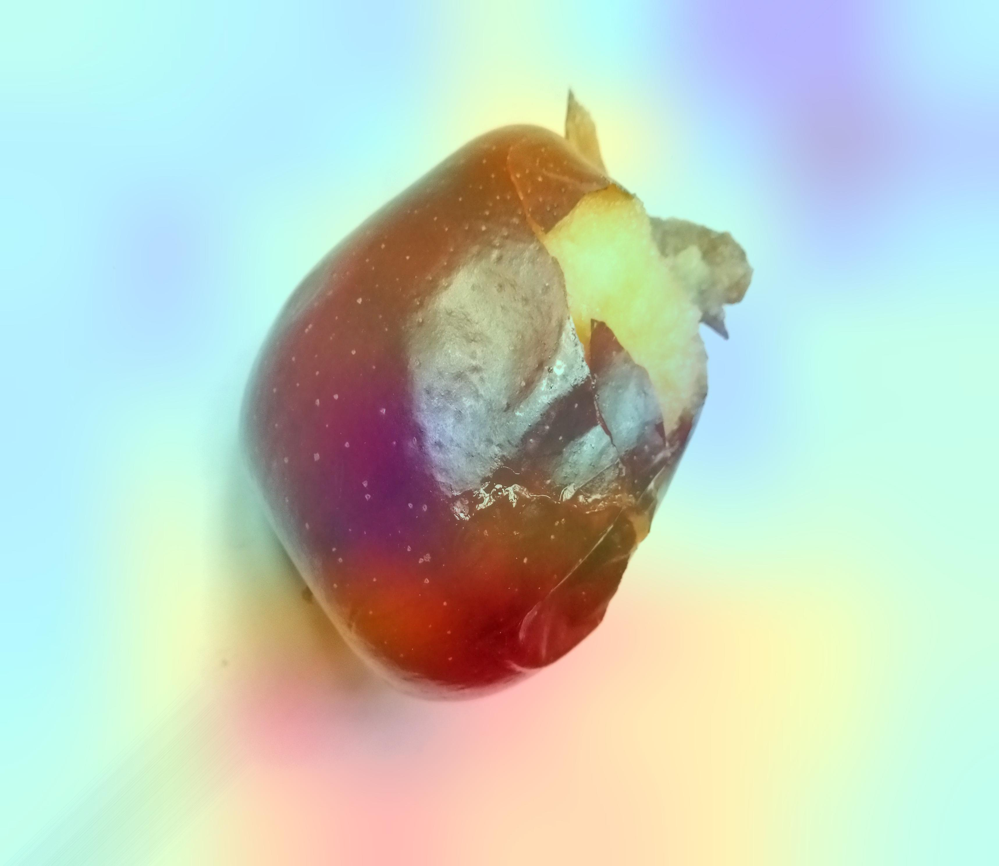

Grad-CAM saved to: /tf/Grad-CAM/Step2/Grad-CAM_6_'Apple_Rotten'_to_'Pomegranate_Rotten'.jpg
Original Image Path : /tf/Fixed_Data/Data_Final/Step2-2/test/Apple_Rotten/aug_RottenApple (198)_4252406a-dfce-41d4-aff4-8d4359a62bfe_0_8092.jpg

real class : Apple_Rotten
predicted class : Apple_Fresh


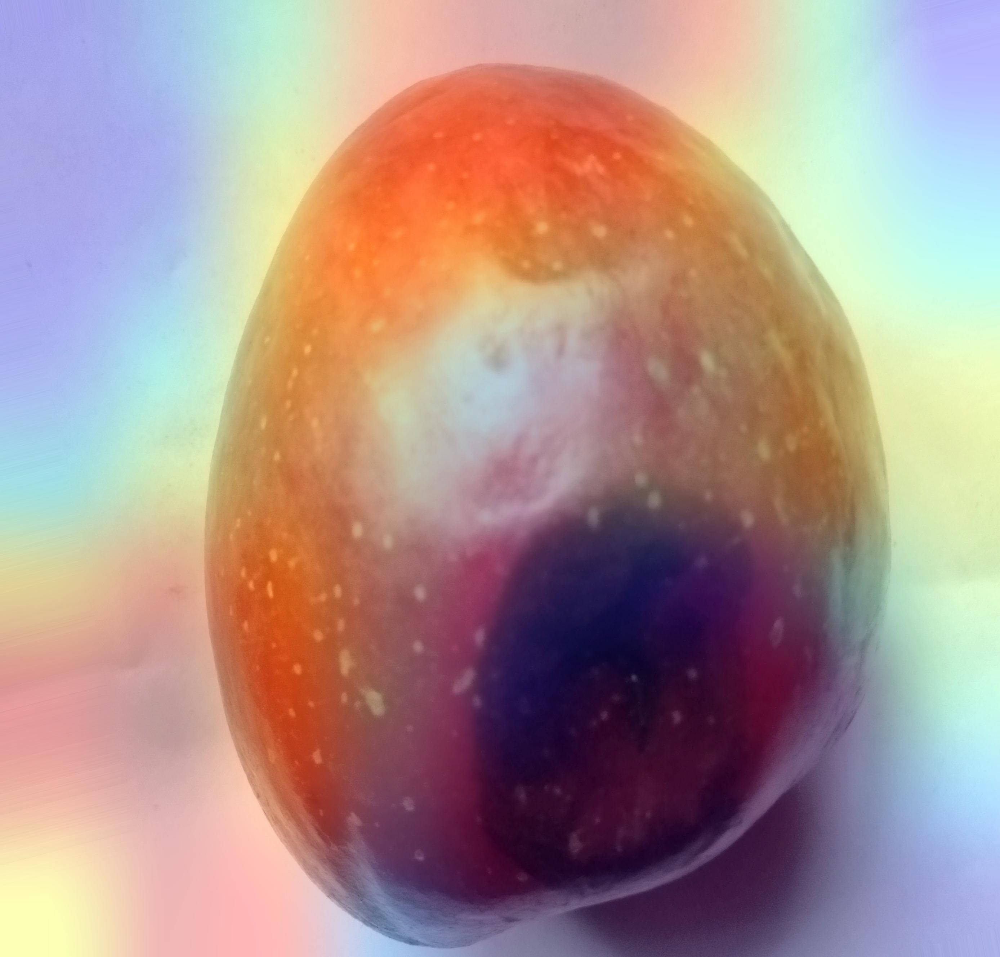

Grad-CAM saved to: /tf/Grad-CAM/Step2/Grad-CAM_7_'Apple_Rotten'_to_'Apple_Fresh'.jpg
Original Image Path : /tf/Fixed_Data/Data_Final/Step2-2/test/Apple_Rotten/aug_RottenApple (21)_989be643-213a-4c90-a23d-548d537f3006_0_69.jpg

real class : Apple_Rotten
predicted class : Pomegranate_Rotten


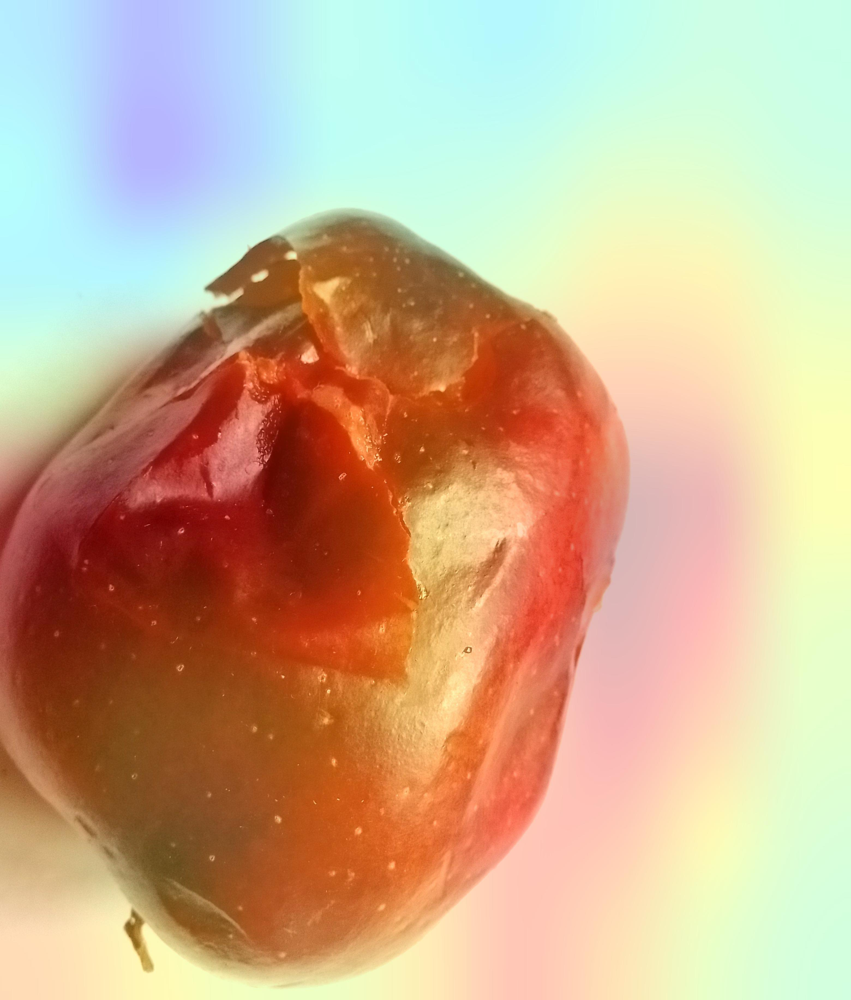

Grad-CAM saved to: /tf/Grad-CAM/Step2/Grad-CAM_8_'Apple_Rotten'_to_'Pomegranate_Rotten'.jpg
Original Image Path : /tf/Fixed_Data/Data_Final/Step2-2/test/Apple_Rotten/aug_RottenApple (23)_66c8765d-e03f-41eb-851d-d38fdeefff34_0_1595.jpg

real class : Apple_Rotten
predicted class : Pomegranate_Fresh


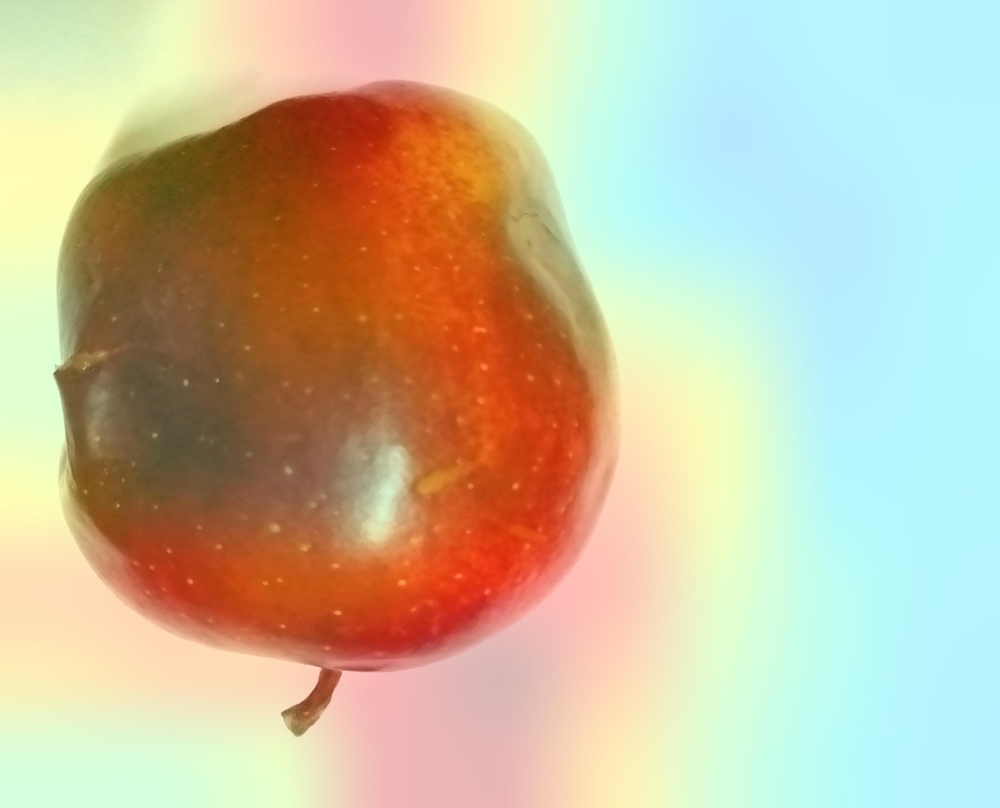

Grad-CAM saved to: /tf/Grad-CAM/Step2/Grad-CAM_9_'Apple_Rotten'_to_'Pomegranate_Fresh'.jpg
Original Image Path : /tf/Fixed_Data/Data_Final/Step2-2/test/Apple_Rotten/aug_RottenApple (60)_f49b588b-1323-4cd0-bd8e-dc2974ad9e4c_0_3585.jpg

real class : Apple_Rotten
predicted class : Tomato_Rotten


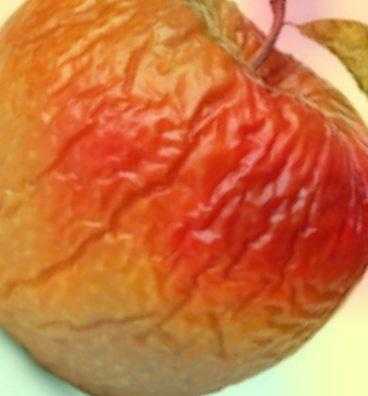

Grad-CAM saved to: /tf/Grad-CAM/Step2/Grad-CAM_10_'Apple_Rotten'_to_'Tomato_Rotten'.jpg
Original Image Path : /tf/Fixed_Data/Data_Final/Step2-2/test/Apple_Rotten/aug_Screen Shot 2018-06-07 at 2_5eb80c0d-9811-450f-8f89-3aa090cefbc8_0_3985.jpg

real class : Apple_Rotten
predicted class : Banana_Fresh


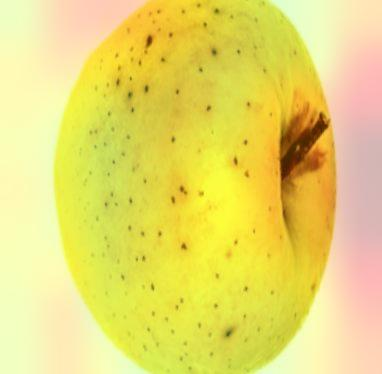

Grad-CAM saved to: /tf/Grad-CAM/Step2/Grad-CAM_11_'Apple_Rotten'_to_'Banana_Fresh'.jpg
Original Image Path : /tf/Fixed_Data/Data_Final/Step2-2/test/Apple_Rotten/aug_Screen Shot 2018-06-07 at 2_7afe6001-8048-477f-af2c-2df740ef8591_0_4586.jpg

real class : Apple_Rotten
predicted class : Tomato_Rotten


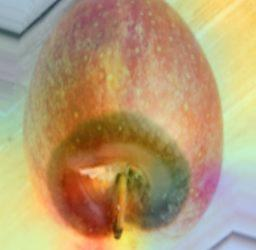

Grad-CAM saved to: /tf/Grad-CAM/Step2/Grad-CAM_12_'Apple_Rotten'_to_'Tomato_Rotten'.jpg
Original Image Path : /tf/Fixed_Data/Data_Final/Step2-2/test/Apple_Rotten/aug_Screen Shot 2018-06-07 at 2_be71a898-76b5-4429-88ca-ac8a1a0e635b_0_8843.jpg

real class : Apple_Rotten
predicted class : Banana_Fresh


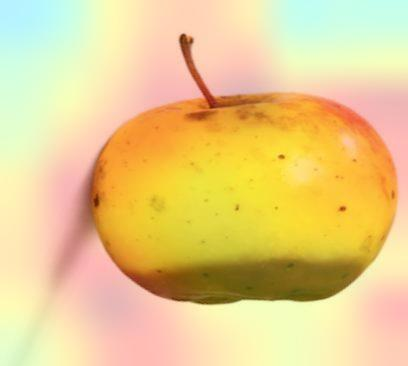

Grad-CAM saved to: /tf/Grad-CAM/Step2/Grad-CAM_13_'Apple_Rotten'_to_'Banana_Fresh'.jpg
Original Image Path : /tf/Fixed_Data/Data_Final/Step2-2/test/Apple_Rotten/aug_Screen Shot 2018-06-07 at 2_d68d1d27-a998-424b-b89a-f61ed308eee8_0_727.jpg

real class : Apple_Rotten
predicted class : Orange_Rotten


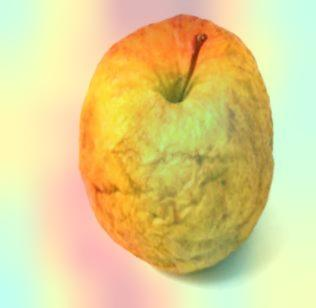

Grad-CAM saved to: /tf/Grad-CAM/Step2/Grad-CAM_14_'Apple_Rotten'_to_'Orange_Rotten'.jpg
Original Image Path : /tf/Fixed_Data/Data_Final/Step2-2/test/Apple_Rotten/aug_Screen Shot 2018-06-07 at 3_6bb6ec51-b4af-453b-a53b-a7cdefc0bdb4_0_5517.jpg

real class : Apple_Rotten
predicted class : Banana_Fresh


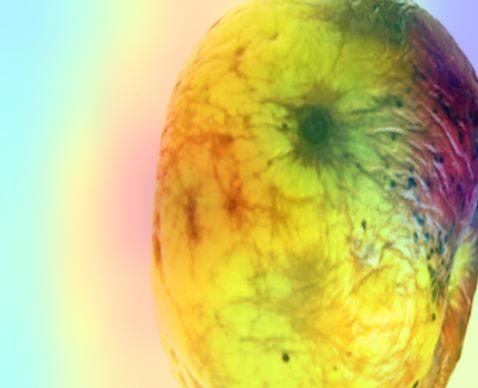

Grad-CAM saved to: /tf/Grad-CAM/Step2/Grad-CAM_15_'Apple_Rotten'_to_'Banana_Fresh'.jpg
Original Image Path : /tf/Fixed_Data/Data_Final/Step2-2/test/Apple_Rotten/aug_Screen Shot 2018-06-08 at 2_01e87385-0204-48e7-9e49-0d9023481be5_0_5943.jpg

real class : Apple_Rotten
predicted class : Pomegranate_Rotten


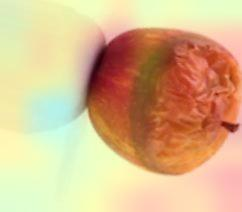

Grad-CAM saved to: /tf/Grad-CAM/Step2/Grad-CAM_16_'Apple_Rotten'_to_'Pomegranate_Rotten'.jpg
Original Image Path : /tf/Fixed_Data/Data_Final/Step2-2/test/Apple_Rotten/aug_Screen Shot 2018-06-08 at 2_2b6d9948-96fd-4eaa-a924-a0d1b068c814_0_3053.jpg

real class : Apple_Rotten
predicted class : Orange_Fresh


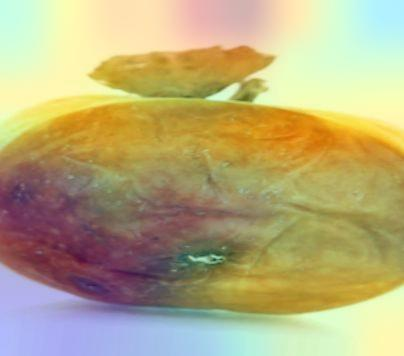

Grad-CAM saved to: /tf/Grad-CAM/Step2/Grad-CAM_17_'Apple_Rotten'_to_'Orange_Fresh'.jpg
Original Image Path : /tf/Fixed_Data/Data_Final/Step2-2/test/Apple_Rotten/aug_Screen Shot 2018-06-08 at 2_74ef46a7-107c-4fbe-ac2a-f4f0b52a12ce_0_8196.jpg

real class : Apple_Rotten
predicted class : Orange_Fresh


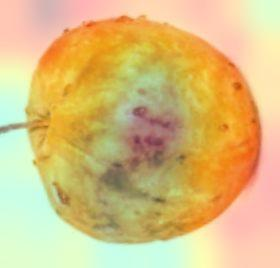

Grad-CAM saved to: /tf/Grad-CAM/Step2/Grad-CAM_18_'Apple_Rotten'_to_'Orange_Fresh'.jpg
Original Image Path : /tf/Fixed_Data/Data_Final/Step2-2/test/Apple_Rotten/aug_Screen Shot 2018-06-08 at 2_9afe1ed7-0c1b-41e2-8005-a56067e60ae8_0_1289.jpg

real class : Apple_Rotten
predicted class : Pomegranate_Rotten


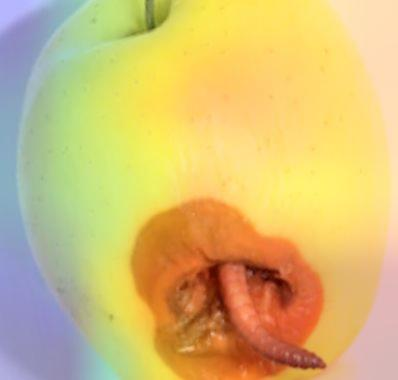

Grad-CAM saved to: /tf/Grad-CAM/Step2/Grad-CAM_19_'Apple_Rotten'_to_'Pomegranate_Rotten'.jpg
Original Image Path : /tf/Fixed_Data/Data_Final/Step2-2/test/Apple_Rotten/aug_Screen Shot 2018-06-08 at 2_9cd995a3-6b1c-4022-af96-90a55bf38ddf_0_5191.jpg

real class : Apple_Rotten
predicted class : Apple_Fresh


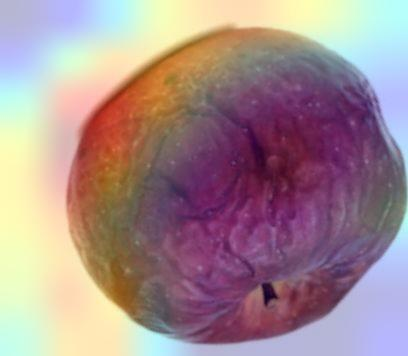

Grad-CAM saved to: /tf/Grad-CAM/Step2/Grad-CAM_20_'Apple_Rotten'_to_'Apple_Fresh'.jpg
Original Image Path : /tf/Fixed_Data/Data_Final/Step2-2/test/Apple_Rotten/aug_Screen Shot 2018-06-08 at 2_effbab58-b9f5-4343-b808-5a8ca4f31ec5_0_2221.jpg

real class : Apple_Rotten
predicted class : Banana_Rotten


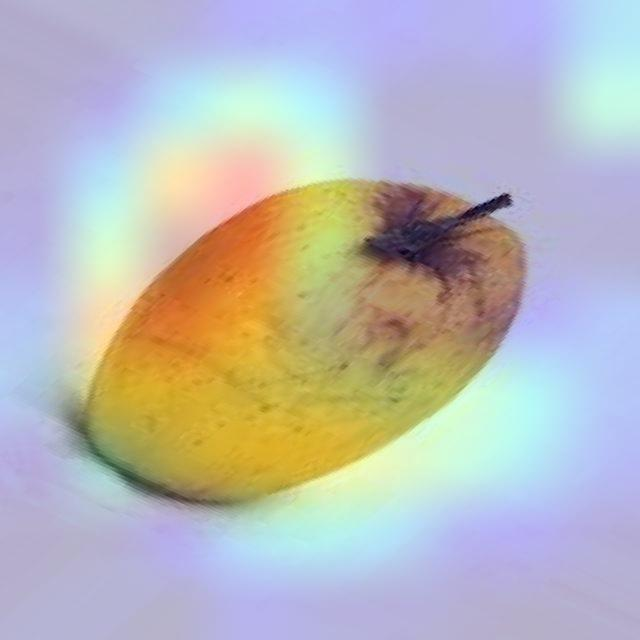

Grad-CAM saved to: /tf/Grad-CAM/Step2/Grad-CAM_21_'Apple_Rotten'_to_'Banana_Rotten'.jpg
Original Image Path : /tf/Fixed_Data/Data_Final/Step2-2/test/Apple_Rotten/aug_damaged_apple-175-_jpg_34e7f1b9-0e16-43b9-bddf-01da9c947ffa_0_8933.jpg

real class : Apple_Rotten
predicted class : Mango_Rotten


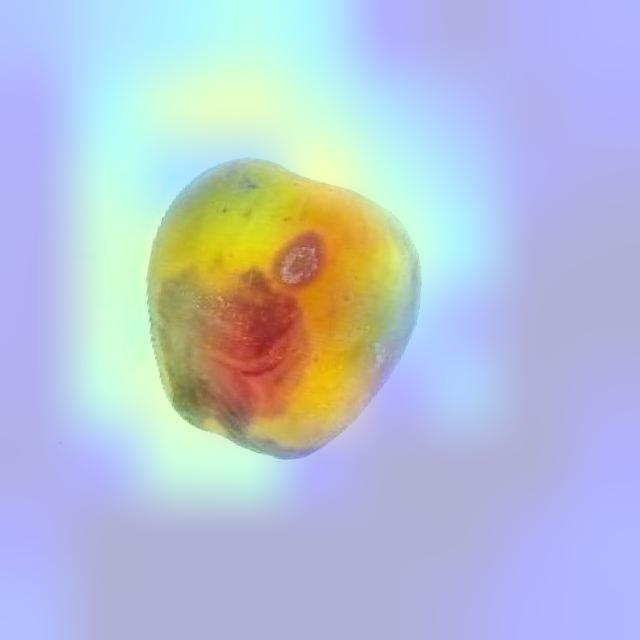

Grad-CAM saved to: /tf/Grad-CAM/Step2/Grad-CAM_22_'Apple_Rotten'_to_'Mango_Rotten'.jpg
Original Image Path : /tf/Fixed_Data/Data_Final/Step2-2/test/Apple_Rotten/aug_img-252-_jpg_653565d2-4944-453b-ad93-b76fc8d28280_0_6025.jpg

real class : Apple_Rotten
predicted class : Pomegranate_Rotten


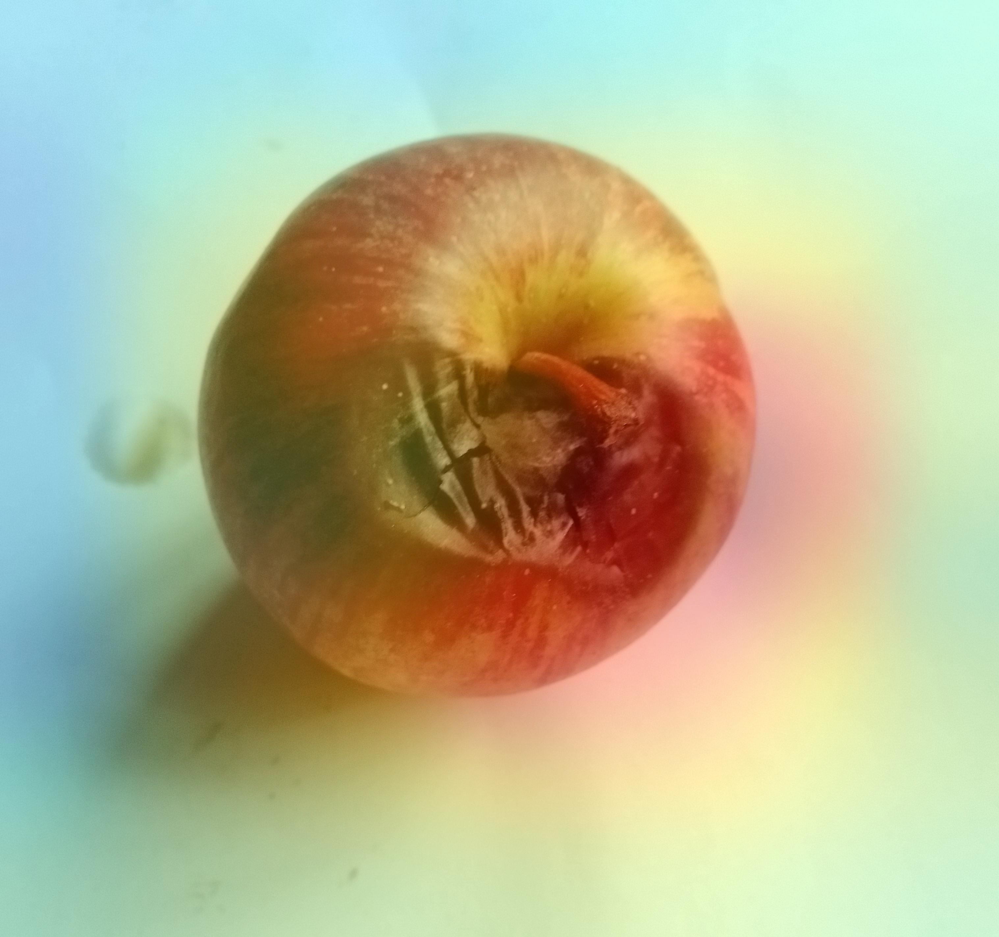

Grad-CAM saved to: /tf/Grad-CAM/Step2/Grad-CAM_23_'Apple_Rotten'_to_'Pomegranate_Rotten'.jpg
Original Image Path : /tf/Fixed_Data/Data_Final/Step2-2/test/Apple_Rotten/original_RottenApple (113).jpg

real class : Apple_Rotten
predicted class : Strawberry_Rotten


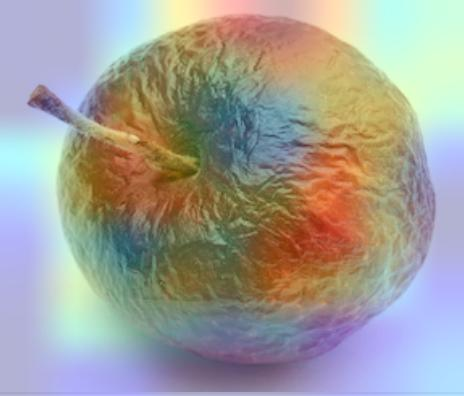

Grad-CAM saved to: /tf/Grad-CAM/Step2/Grad-CAM_24_'Apple_Rotten'_to_'Strawberry_Rotten'.jpg
Original Image Path : /tf/Fixed_Data/Data_Final/Step2-2/test/Apple_Rotten/original_Screen Shot 2018-06-07 at 2.37.11 PM.png

real class : Apple_Rotten
predicted class : Banana_Fresh


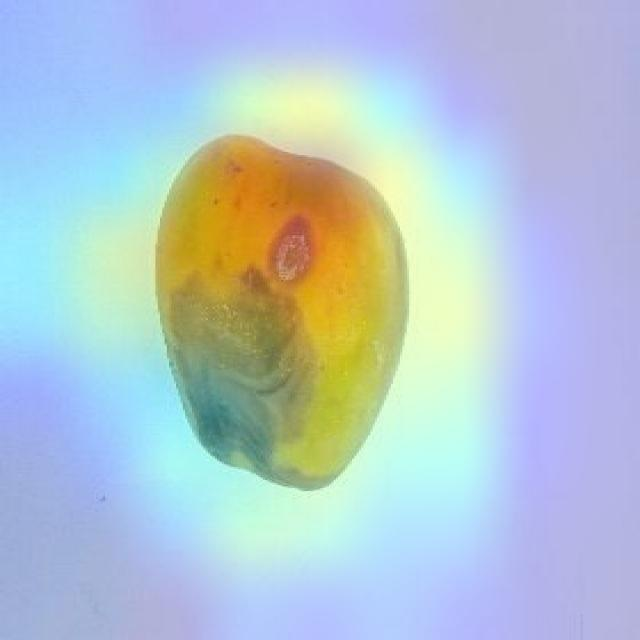

Grad-CAM saved to: /tf/Grad-CAM/Step2/Grad-CAM_25_'Apple_Rotten'_to_'Banana_Fresh'.jpg
Original Image Path : /tf/Fixed_Data/Data_Final/Step2-2/test/Apple_Rotten/original_img-252-_jpg.rf.745dadd34d03fb5dc698687190123c55.jpg

real class : Banana_Fresh
predicted class : Mango_Rotten


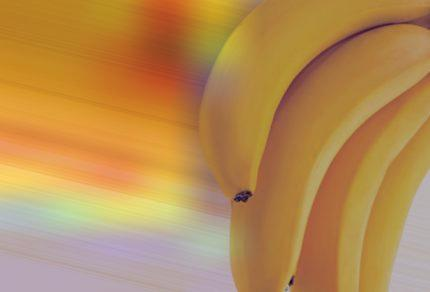

Grad-CAM saved to: /tf/Grad-CAM/Step2/Grad-CAM_26_'Banana_Fresh'_to_'Mango_Rotten'.jpg
Original Image Path : /tf/Fixed_Data/Data_Final/Step2-2/test/Banana_Fresh/aug_freshBanana (4)_59be7bc9-26a8-4c5e-a304-2cab2295e228_0_8948.jpg

real class : Banana_Rotten
predicted class : Orange_Rotten


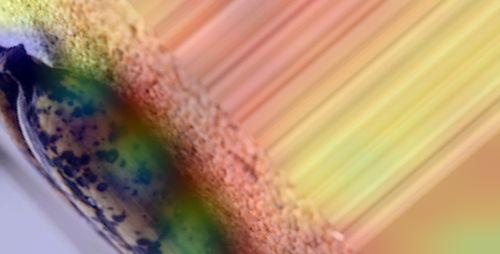

Grad-CAM saved to: /tf/Grad-CAM/Step2/Grad-CAM_27_'Banana_Rotten'_to_'Orange_Rotten'.jpg
Original Image Path : /tf/Fixed_Data/Data_Final/Step2-2/test/Banana_Rotten/aug_Screen Shot 2018-06-12 at 9_12c4c8c2-2df1-44f6-b946-414ec1a5373d_0_1854.jpg

real class : Banana_Rotten
predicted class : Banana_Fresh


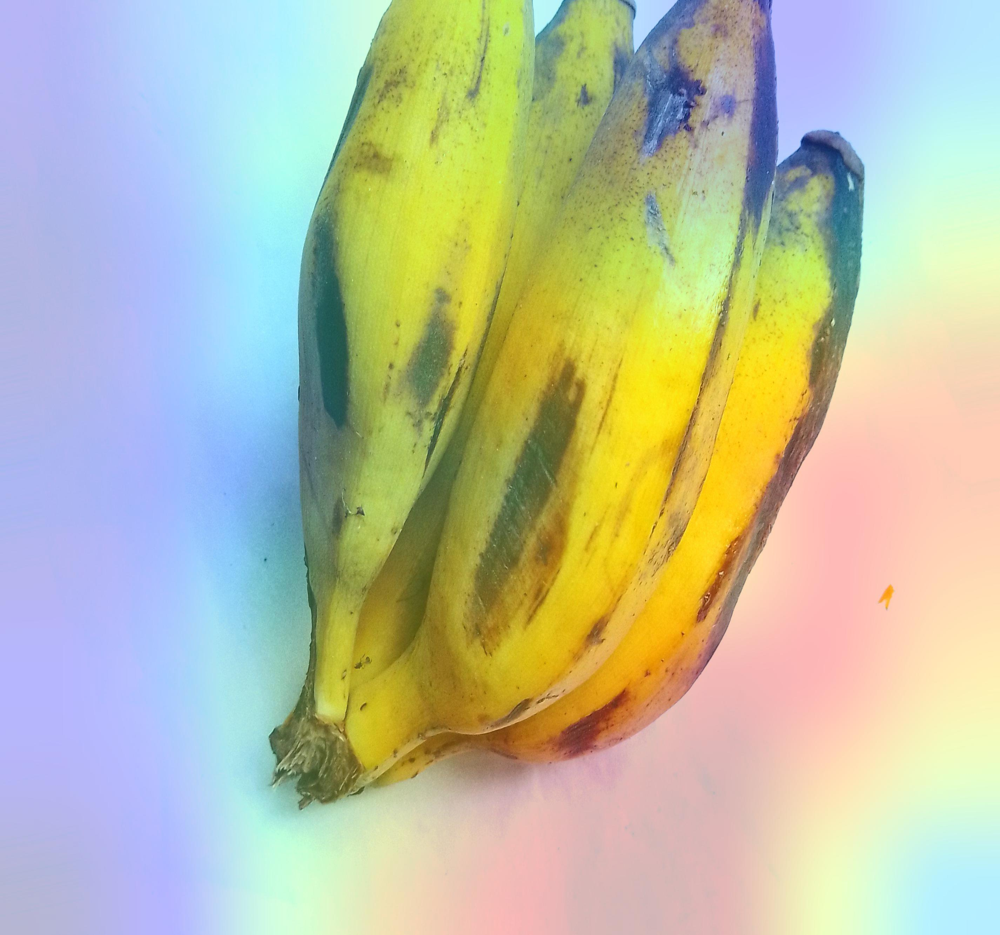

Grad-CAM saved to: /tf/Grad-CAM/Step2/Grad-CAM_28_'Banana_Rotten'_to_'Banana_Fresh'.jpg
Original Image Path : /tf/Fixed_Data/Data_Final/Step2-2/test/Banana_Rotten/aug_rottenBanana (13)_60d2d6d6-f28e-4b5b-a726-94ea62f52106_0_2696.jpg

real class : Banana_Rotten
predicted class : Pomegranate_Rotten


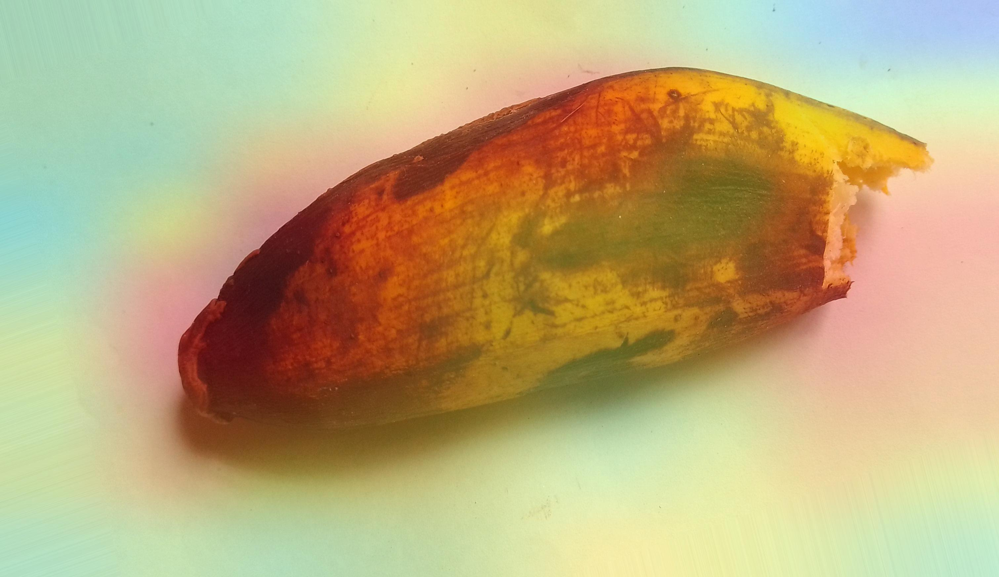

Grad-CAM saved to: /tf/Grad-CAM/Step2/Grad-CAM_29_'Banana_Rotten'_to_'Pomegranate_Rotten'.jpg
Original Image Path : /tf/Fixed_Data/Data_Final/Step2-2/test/Banana_Rotten/aug_rottenBanana (155)_325ef21b-30af-441c-b440-8e6fb5b8ca59_0_6217.jpg

real class : Banana_Rotten
predicted class : Orange_Rotten


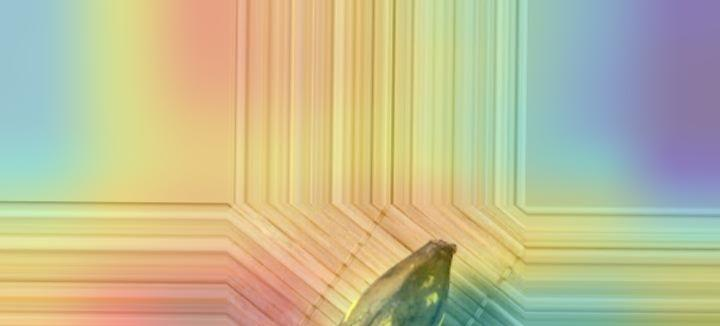

Grad-CAM saved to: /tf/Grad-CAM/Step2/Grad-CAM_30_'Banana_Rotten'_to_'Orange_Rotten'.jpg
Original Image Path : /tf/Fixed_Data/Data_Final/Step2-2/test/Banana_Rotten/aug_rottenBanana (213)_1d68d8f4-c4dd-4845-87be-854448985f7f_0_1163.jpg

real class : Lemon_Fresh
predicted class : Olive_Fresh


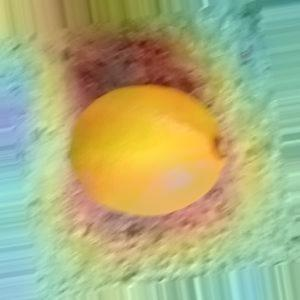

Grad-CAM saved to: /tf/Grad-CAM/Step2/Grad-CAM_31_'Lemon_Fresh'_to_'Olive_Fresh'.jpg
Original Image Path : /tf/Fixed_Data/Data_Final/Step2-2/test/Lemon_Fresh/aug_good_quality_736_ead42f05-8438-4b9b-8532-d47a983b6749_0_2885.jpg

real class : Lemon_Rotten
predicted class : Lemon_Fresh


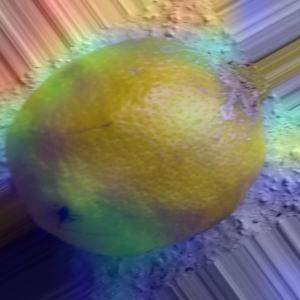

Grad-CAM saved to: /tf/Grad-CAM/Step2/Grad-CAM_32_'Lemon_Rotten'_to_'Lemon_Fresh'.jpg
Original Image Path : /tf/Fixed_Data/Data_Final/Step2-2/test/Lemon_Rotten/aug_bad_quality_482_a75e8a65-668f-4a1b-b649-dd3d1a1cb81a_0_2906.jpg

real class : Lemon_Rotten
predicted class : Lemon_Fresh


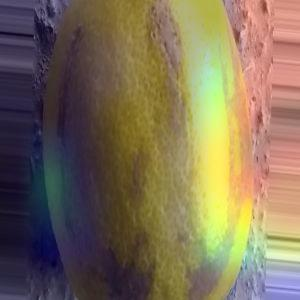

Grad-CAM saved to: /tf/Grad-CAM/Step2/Grad-CAM_33_'Lemon_Rotten'_to_'Lemon_Fresh'.jpg
Original Image Path : /tf/Fixed_Data/Data_Final/Step2-2/test/Lemon_Rotten/aug_bad_quality_488_a7cf7ea3-0190-451c-8836-16f381b82a83_0_5619.jpg

real class : Lemon_Rotten
predicted class : Lemon_Fresh


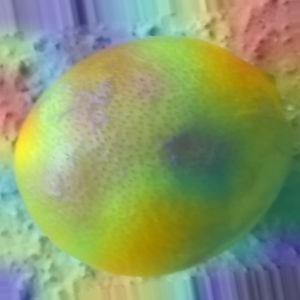

Grad-CAM saved to: /tf/Grad-CAM/Step2/Grad-CAM_34_'Lemon_Rotten'_to_'Lemon_Fresh'.jpg
Original Image Path : /tf/Fixed_Data/Data_Final/Step2-2/test/Lemon_Rotten/aug_bad_quality_561_acabb390-af51-469e-9a79-d9182cf0f328_0_6567.jpg

real class : Lemon_Rotten
predicted class : Lemon_Fresh


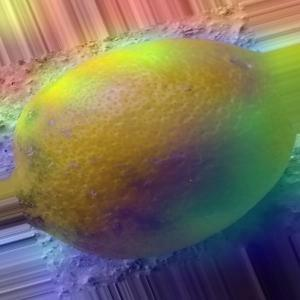

Grad-CAM saved to: /tf/Grad-CAM/Step2/Grad-CAM_35_'Lemon_Rotten'_to_'Lemon_Fresh'.jpg
Original Image Path : /tf/Fixed_Data/Data_Final/Step2-2/test/Lemon_Rotten/aug_bad_quality_736_bbdec8bc-92a2-4fa1-9f76-dad390993d95_0_4261.jpg

real class : Lemon_Rotten
predicted class : Apple_Rotten


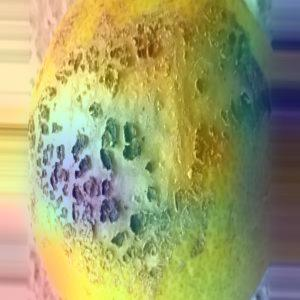

Grad-CAM saved to: /tf/Grad-CAM/Step2/Grad-CAM_36_'Lemon_Rotten'_to_'Apple_Rotten'.jpg
Original Image Path : /tf/Fixed_Data/Data_Final/Step2-2/test/Lemon_Rotten/aug_bad_quality_850_da91ff59-4698-452b-860e-3efece93f159_0_3383.jpg

real class : Mango_Fresh
predicted class : Pomegranate_Fresh


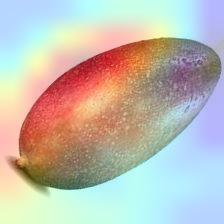

Grad-CAM saved to: /tf/Grad-CAM/Step2/Grad-CAM_37_'Mango_Fresh'_to_'Pomegranate_Fresh'.jpg
Original Image Path : /tf/Fixed_Data/Data_Final/Step2-2/test/Mango_Fresh/aug_healthy_019_d09785c2-1d72-4bc3-a822-56e095f2c1e3_0_5794.jpg

real class : Mango_Fresh
predicted class : Apple_Rotten


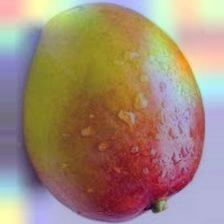

Grad-CAM saved to: /tf/Grad-CAM/Step2/Grad-CAM_38_'Mango_Fresh'_to_'Apple_Rotten'.jpg
Original Image Path : /tf/Fixed_Data/Data_Final/Step2-2/test/Mango_Fresh/aug_healthy_120_32b5640d-ab6a-464c-95ea-aa6ce4cc7d18_0_4807.jpg

real class : Mango_Rotten
predicted class : Pomegranate_Rotten


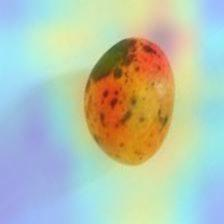

Grad-CAM saved to: /tf/Grad-CAM/Step2/Grad-CAM_39_'Mango_Rotten'_to_'Pomegranate_Rotten'.jpg
Original Image Path : /tf/Fixed_Data/Data_Final/Step2-2/test/Mango_Rotten/aug_195_9181668e-aebf-42b0-883f-4065aef19e26_0_6495.jpg

real class : Mango_Rotten
predicted class : Mango_Fresh


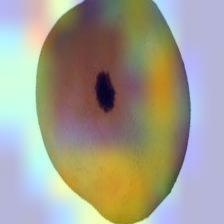

Grad-CAM saved to: /tf/Grad-CAM/Step2/Grad-CAM_40_'Mango_Rotten'_to_'Mango_Fresh'.jpg
Original Image Path : /tf/Fixed_Data/Data_Final/Step2-2/test/Mango_Rotten/aug_alternaria_028_5a08c590-9d25-4fc0-8522-332a12d630d8_0_8403.jpg

real class : Mango_Rotten
predicted class : Mango_Fresh


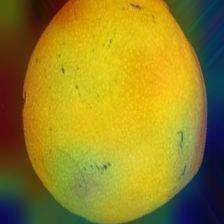

Grad-CAM saved to: /tf/Grad-CAM/Step2/Grad-CAM_41_'Mango_Rotten'_to_'Mango_Fresh'.jpg
Original Image Path : /tf/Fixed_Data/Data_Final/Step2-2/test/Mango_Rotten/aug_anthracnose_002_26362d79-2bb8-41d9-a9c7-bdf2e79c3c47_0_7539.jpg

real class : Mango_Rotten
predicted class : Banana_Fresh


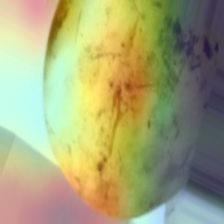

Grad-CAM saved to: /tf/Grad-CAM/Step2/Grad-CAM_42_'Mango_Rotten'_to_'Banana_Fresh'.jpg
Original Image Path : /tf/Fixed_Data/Data_Final/Step2-2/test/Mango_Rotten/aug_anthracnose_035_8cc53f2f-5339-4e3c-84be-075e6345ef7c_0_9495.jpg

real class : Mango_Rotten
predicted class : Mango_Fresh


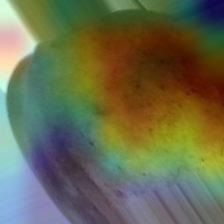

Grad-CAM saved to: /tf/Grad-CAM/Step2/Grad-CAM_43_'Mango_Rotten'_to_'Mango_Fresh'.jpg
Original Image Path : /tf/Fixed_Data/Data_Final/Step2-2/test/Mango_Rotten/aug_anthracnose_042_334dcdbc-8d24-4aa4-8be1-65a9155f8fe2_0_5988.jpg

real class : Mango_Rotten
predicted class : Olive_Fresh


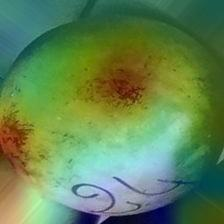

Grad-CAM saved to: /tf/Grad-CAM/Step2/Grad-CAM_44_'Mango_Rotten'_to_'Olive_Fresh'.jpg
Original Image Path : /tf/Fixed_Data/Data_Final/Step2-2/test/Mango_Rotten/aug_anthracnose_063_ad6aa75c-5cf3-445e-a383-459b33367463_0_1837.jpg

real class : Mango_Rotten
predicted class : Apple_Fresh


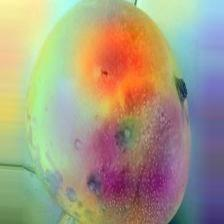

Grad-CAM saved to: /tf/Grad-CAM/Step2/Grad-CAM_45_'Mango_Rotten'_to_'Apple_Fresh'.jpg
Original Image Path : /tf/Fixed_Data/Data_Final/Step2-2/test/Mango_Rotten/aug_aspergillus_045_90d95394-5b05-4b79-bfa0-d0a672f0a339_0_1144.jpg

real class : Mango_Rotten
predicted class : Banana_Rotten


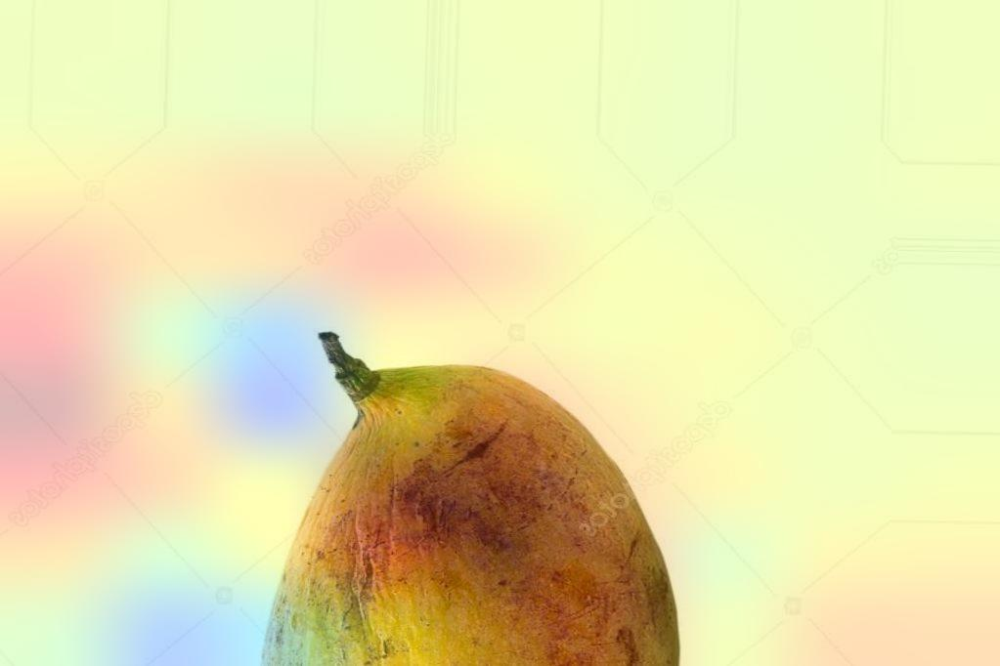

Grad-CAM saved to: /tf/Grad-CAM/Step2/Grad-CAM_46_'Mango_Rotten'_to_'Banana_Rotten'.jpg
Original Image Path : /tf/Fixed_Data/Data_Final/Step2-2/test/Mango_Rotten/aug_rottenMango (257)_5ea01a64-5a3c-4681-8c76-4582cd8abd1b_0_9387.jpg

real class : Mango_Rotten
predicted class : Mango_Fresh


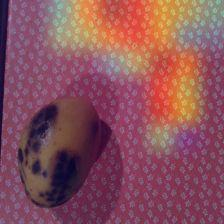

Grad-CAM saved to: /tf/Grad-CAM/Step2/Grad-CAM_47_'Mango_Rotten'_to_'Mango_Fresh'.jpg
Original Image Path : /tf/Fixed_Data/Data_Final/Step2-2/test/Mango_Rotten/original_478.jpg

real class : Mango_Rotten
predicted class : Banana_Fresh


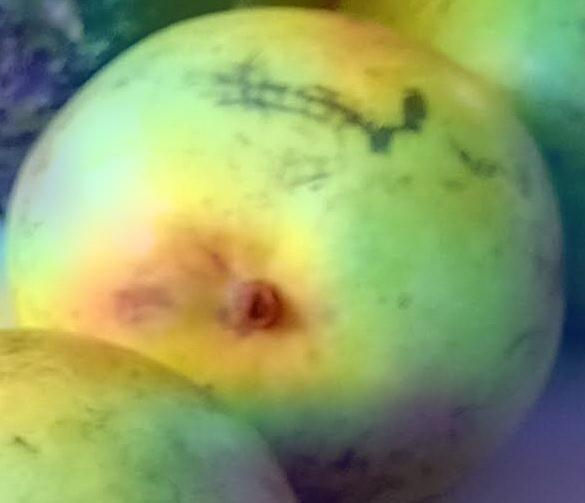

Grad-CAM saved to: /tf/Grad-CAM/Step2/Grad-CAM_48_'Mango_Rotten'_to_'Banana_Fresh'.jpg
Original Image Path : /tf/Fixed_Data/Data_Final/Step2-2/test/Mango_Rotten/original_anthracnose_127.jpg

real class : Mango_Rotten
predicted class : Apple_Rotten


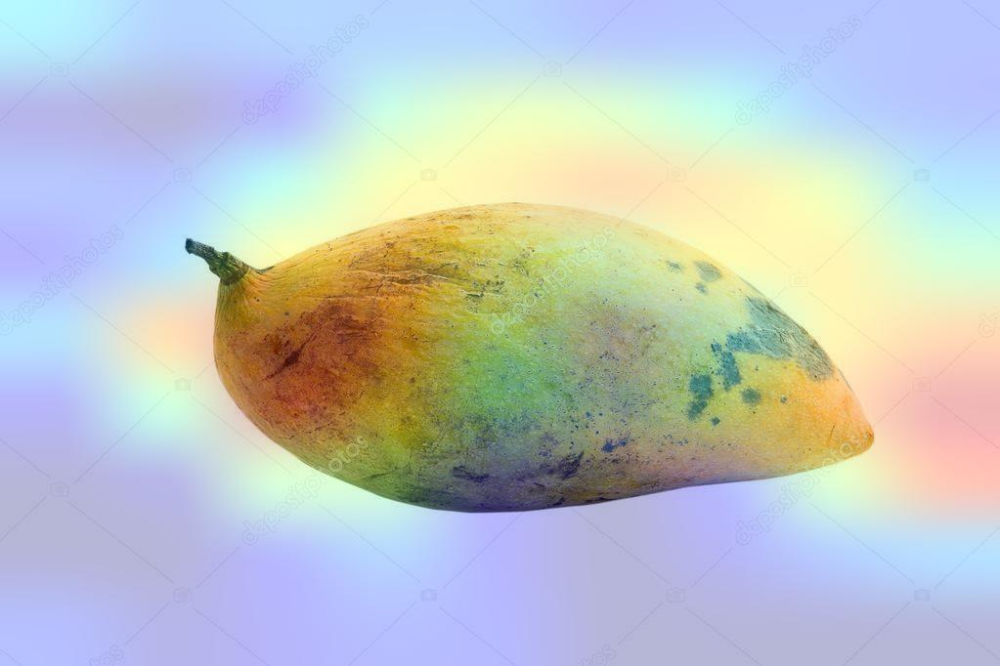

Grad-CAM saved to: /tf/Grad-CAM/Step2/Grad-CAM_49_'Mango_Rotten'_to_'Apple_Rotten'.jpg
Original Image Path : /tf/Fixed_Data/Data_Final/Step2-2/test/Mango_Rotten/original_rottenMango (257).jpg

real class : Olive_Fresh
predicted class : Mango_Fresh


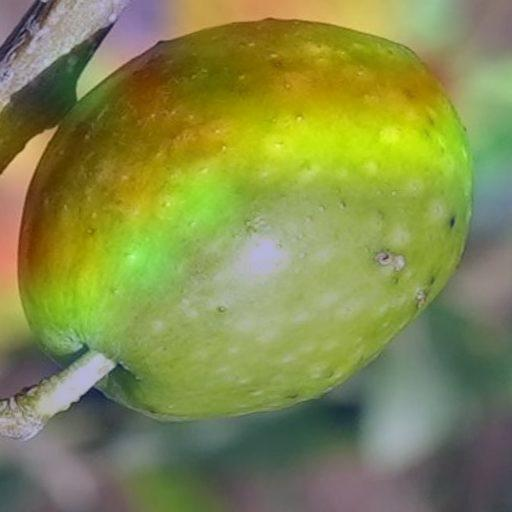

Grad-CAM saved to: /tf/Grad-CAM/Step2/Grad-CAM_50_'Olive_Fresh'_to_'Mango_Fresh'.jpg
Original Image Path : /tf/Fixed_Data/Data_Final/Step2-2/test/Olive_Fresh/aug_HF003_02_999_01282_8deddfee-a7c3-4dbc-a036-5eee7b1f969a_0_2592.jpg

real class : Olive_Fresh
predicted class : Mango_Fresh


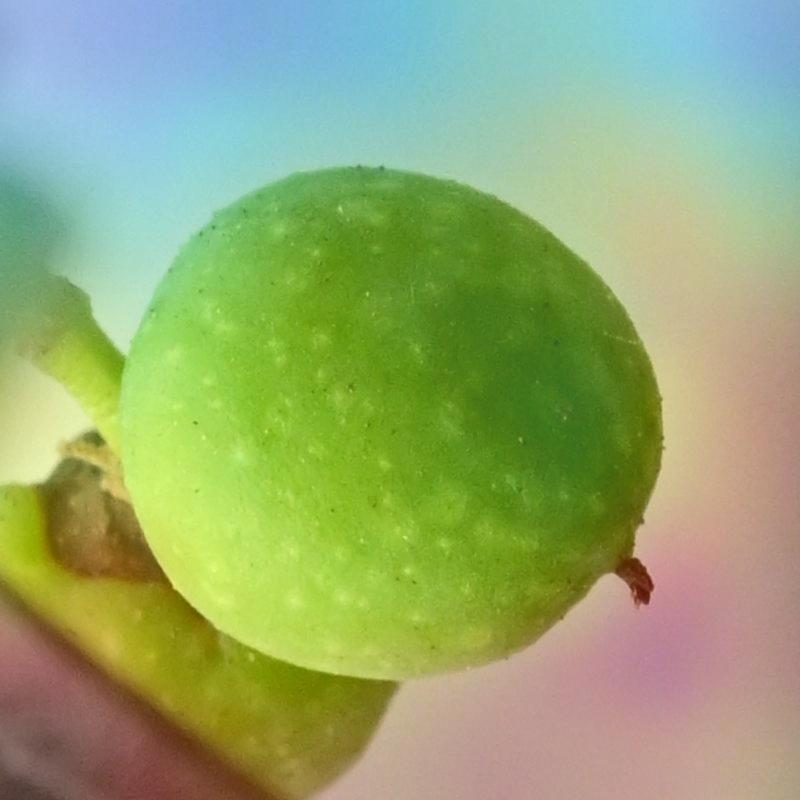

Grad-CAM saved to: /tf/Grad-CAM/Step2/Grad-CAM_51_'Olive_Fresh'_to_'Mango_Fresh'.jpg
Original Image Path : /tf/Fixed_Data/Data_Final/Step2-2/test/Olive_Fresh/aug_HF003_02_999_02118_e3dbc629-af8b-4e7e-8eaa-feffed907b36_0_2551.jpg

real class : Olive_Fresh
predicted class : Apple_Fresh


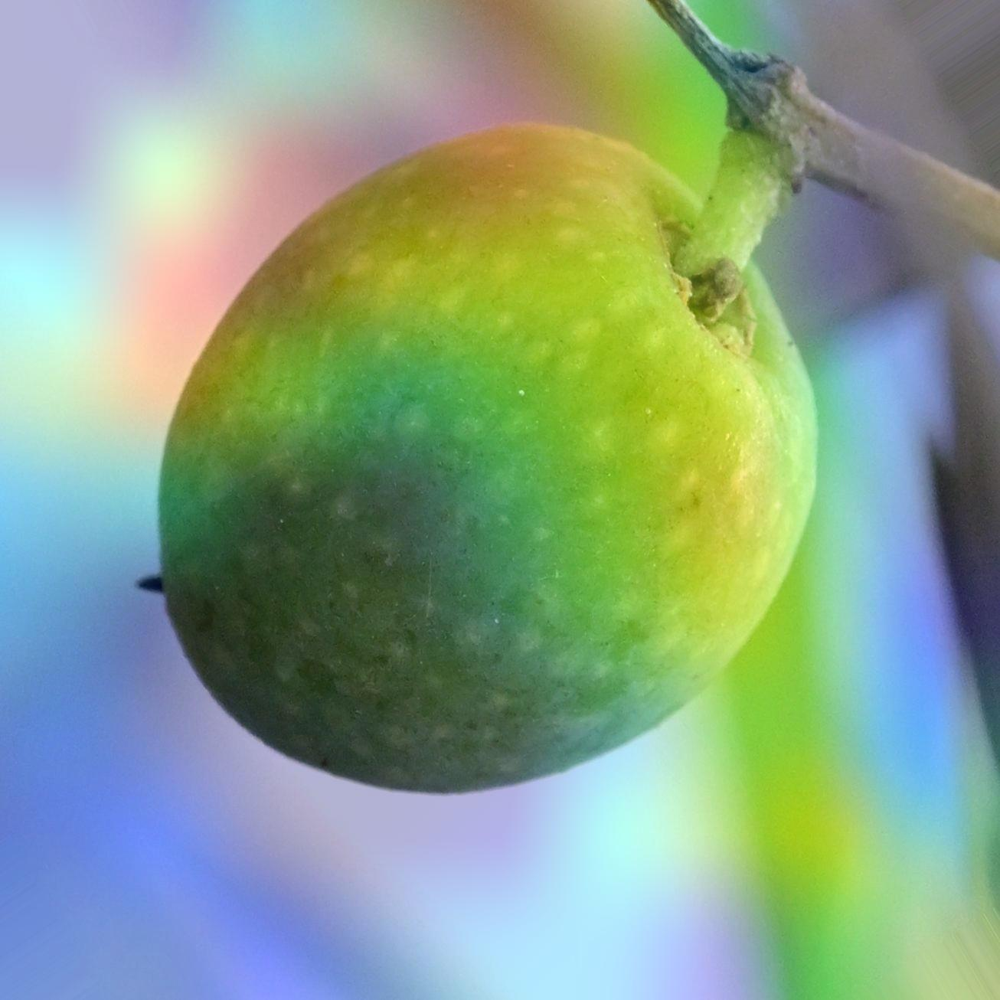

Grad-CAM saved to: /tf/Grad-CAM/Step2/Grad-CAM_52_'Olive_Fresh'_to_'Apple_Fresh'.jpg
Original Image Path : /tf/Fixed_Data/Data_Final/Step2-2/test/Olive_Fresh/aug_HF003_02_999_02234_1e952e70-ee8b-4731-a330-92b77c934306_0_8.jpg

real class : Olive_Rotten
predicted class : Strawberry_Rotten


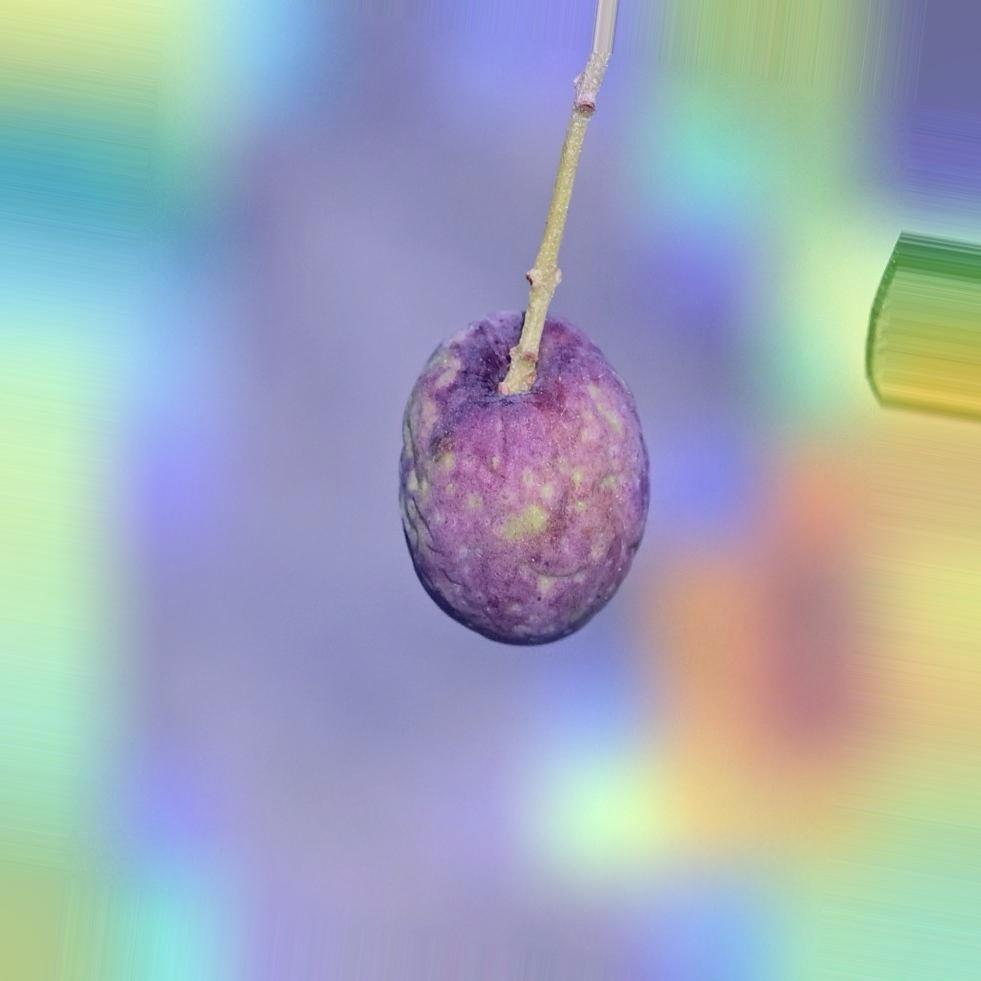

Grad-CAM saved to: /tf/Grad-CAM/Step2/Grad-CAM_53_'Olive_Rotten'_to_'Strawberry_Rotten'.jpg
Original Image Path : /tf/Fixed_Data/Data_Final/Step2-2/test/Olive_Rotten/aug_HF003_02_016_00403_82e892bb-a7c2-48f0-90c9-16ee996c0730_0_3471.jpg

real class : Olive_Rotten
predicted class : Banana_Rotten


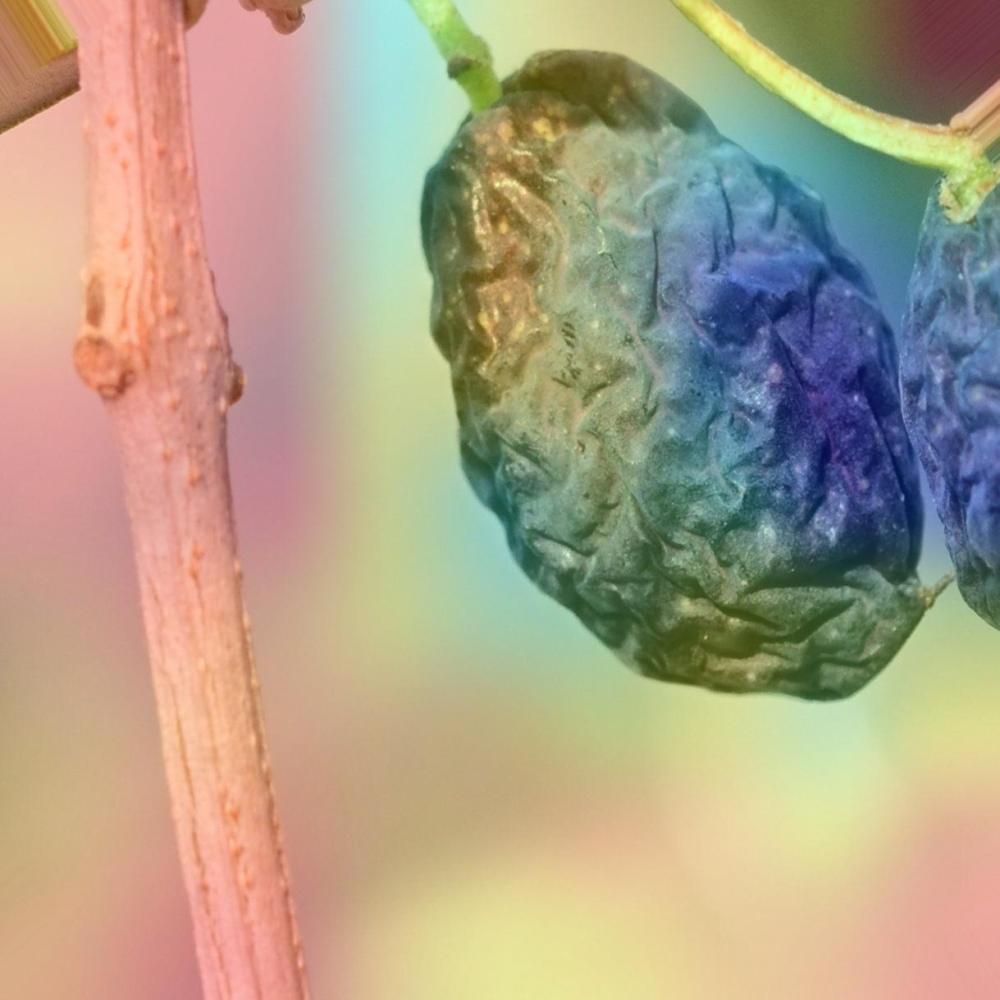

Grad-CAM saved to: /tf/Grad-CAM/Step2/Grad-CAM_54_'Olive_Rotten'_to_'Banana_Rotten'.jpg
Original Image Path : /tf/Fixed_Data/Data_Final/Step2-2/test/Olive_Rotten/aug_HF003_02_016_00460_7ee24fb4-3e7f-4dcf-a8fe-2f041094867b_0_7813.jpg

real class : Olive_Rotten
predicted class : Strawberry_Rotten


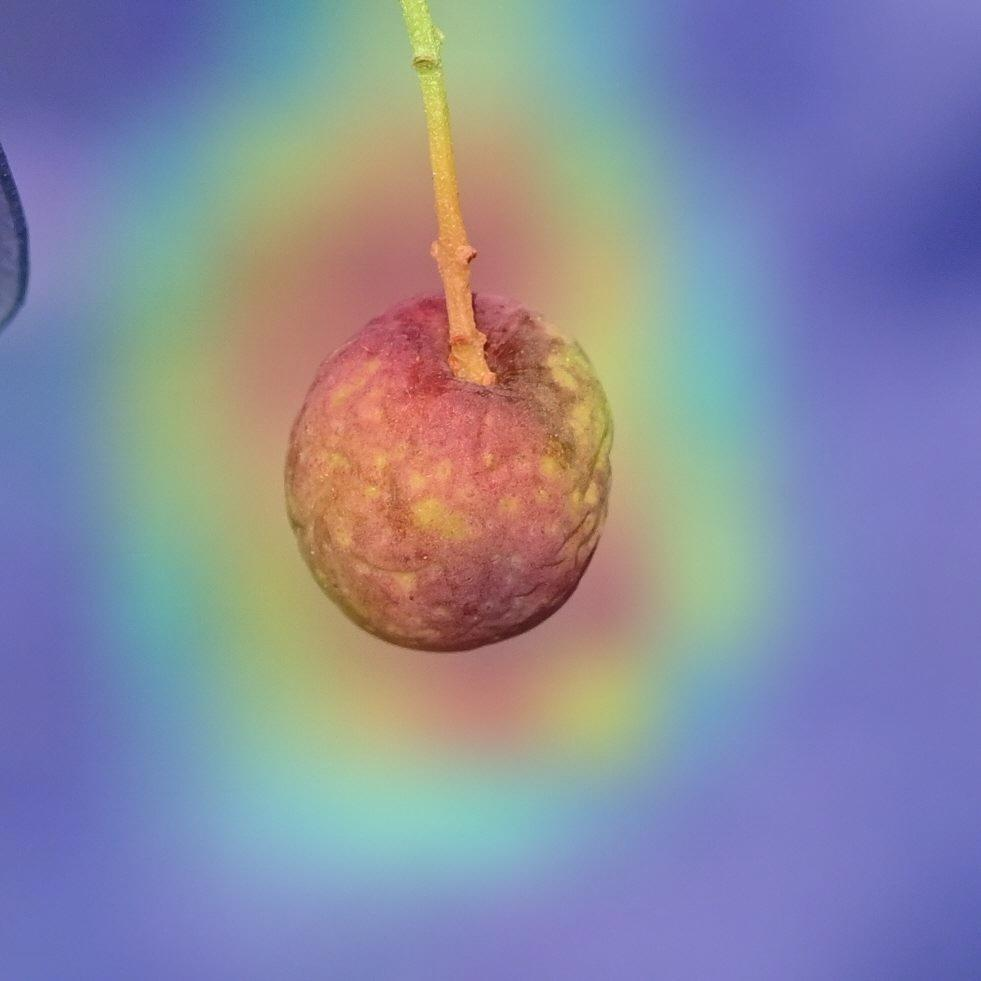

Grad-CAM saved to: /tf/Grad-CAM/Step2/Grad-CAM_55_'Olive_Rotten'_to_'Strawberry_Rotten'.jpg
Original Image Path : /tf/Fixed_Data/Data_Final/Step2-2/test/Olive_Rotten/original_HF003_02_016_00403.jpg

real class : Orange_Fresh
predicted class : Banana_Rotten


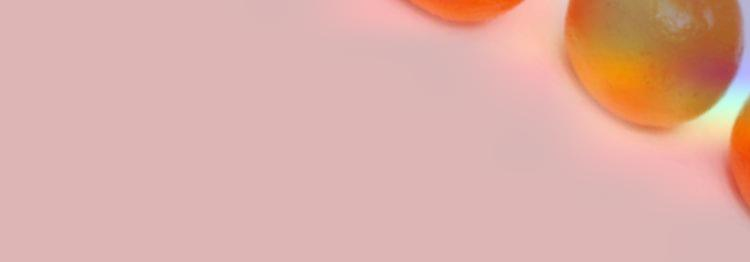

Grad-CAM saved to: /tf/Grad-CAM/Step2/Grad-CAM_56_'Orange_Fresh'_to_'Banana_Rotten'.jpg
Original Image Path : /tf/Fixed_Data/Data_Final/Step2-2/test/Orange_Fresh/aug_Screen Shot 2018-06-12 at 11_eae009ca-b9c8-4dc9-8895-72b86bc1c188_0_2568.jpg

real class : Orange_Fresh
predicted class : Orange_Rotten


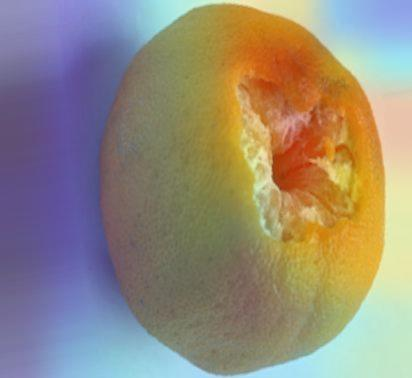

Grad-CAM saved to: /tf/Grad-CAM/Step2/Grad-CAM_57_'Orange_Fresh'_to_'Orange_Rotten'.jpg
Original Image Path : /tf/Fixed_Data/Data_Final/Step2-2/test/Orange_Fresh/aug_Screen Shot 2018-06-13 at 12_2b75f90e-c0df-4655-8ec1-60de5b3e3295_0_3349.jpg

real class : Orange_Fresh
predicted class : Mango_Fresh


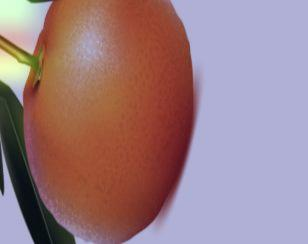

Grad-CAM saved to: /tf/Grad-CAM/Step2/Grad-CAM_58_'Orange_Fresh'_to_'Mango_Fresh'.jpg
Original Image Path : /tf/Fixed_Data/Data_Final/Step2-2/test/Orange_Fresh/aug_Screen Shot 2018-06-13 at 12_f4d76d34-8701-48cf-9192-a50462caf624_0_4947.jpg

real class : Orange_Fresh
predicted class : Orange_Rotten


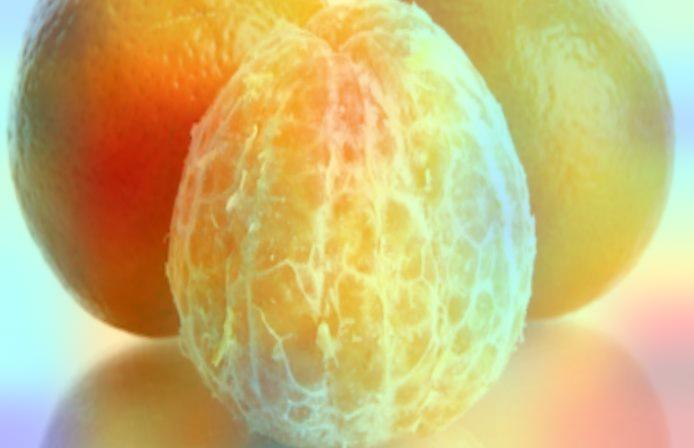

Grad-CAM saved to: /tf/Grad-CAM/Step2/Grad-CAM_59_'Orange_Fresh'_to_'Orange_Rotten'.jpg
Original Image Path : /tf/Fixed_Data/Data_Final/Step2-2/test/Orange_Fresh/aug_Screen Shot 2018-06-13 at 12_fe7dd7e8-6a8f-4d43-8cfe-fb99bca2d413_0_2345.jpg

real class : Orange_Fresh
predicted class : Orange_Rotten


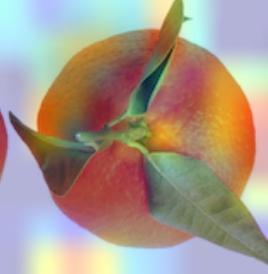

Grad-CAM saved to: /tf/Grad-CAM/Step2/Grad-CAM_60_'Orange_Fresh'_to_'Orange_Rotten'.jpg
Original Image Path : /tf/Fixed_Data/Data_Final/Step2-2/test/Orange_Fresh/original_Screen Shot 2018-06-13 at 12.10.10 AM.png

real class : Orange_Fresh
predicted class : Orange_Rotten


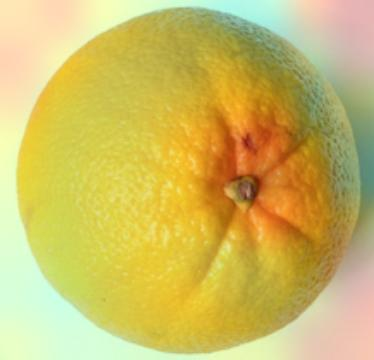

Grad-CAM saved to: /tf/Grad-CAM/Step2/Grad-CAM_61_'Orange_Fresh'_to_'Orange_Rotten'.jpg
Original Image Path : /tf/Fixed_Data/Data_Final/Step2-2/test/Orange_Fresh/original_Screen Shot 2018-06-13 at 12.18.34 AM.png

real class : Orange_Rotten
predicted class : Orange_Fresh


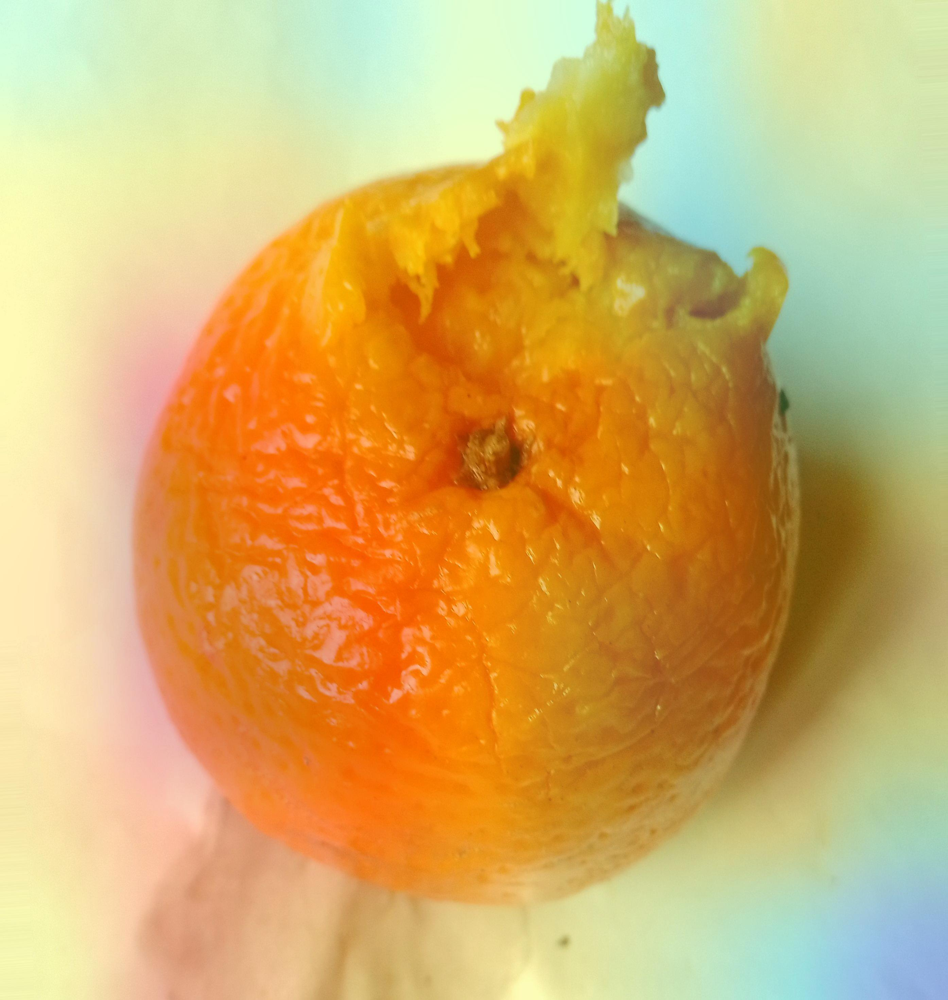

Grad-CAM saved to: /tf/Grad-CAM/Step2/Grad-CAM_62_'Orange_Rotten'_to_'Orange_Fresh'.jpg
Original Image Path : /tf/Fixed_Data/Data_Final/Step2-2/test/Orange_Rotten/aug_RottenOrange (76)_788fab0a-39e1-4f7c-9ce9-c3e3d62c0619_0_4303.jpg

real class : Orange_Rotten
predicted class : Apple_Rotten


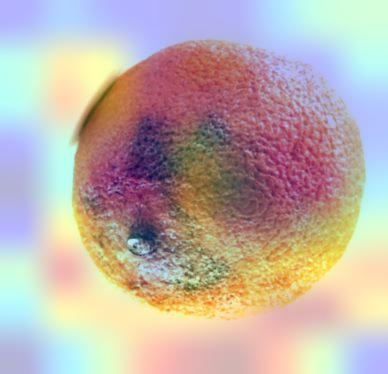

Grad-CAM saved to: /tf/Grad-CAM/Step2/Grad-CAM_63_'Orange_Rotten'_to_'Apple_Rotten'.jpg
Original Image Path : /tf/Fixed_Data/Data_Final/Step2-2/test/Orange_Rotten/aug_Screen Shot 2018-06-12 at 11_b51b8475-cd82-435b-9db8-dd0667e20147_0_7585.jpg

real class : Orange_Rotten
predicted class : Orange_Fresh


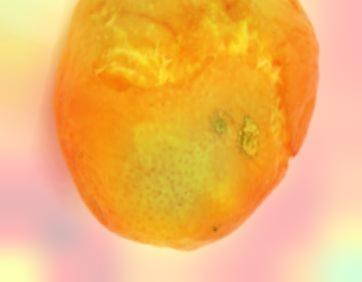

Grad-CAM saved to: /tf/Grad-CAM/Step2/Grad-CAM_64_'Orange_Rotten'_to_'Orange_Fresh'.jpg
Original Image Path : /tf/Fixed_Data/Data_Final/Step2-2/test/Orange_Rotten/aug_Screen Shot 2018-06-12 at 11_bea800e9-cccb-4f71-8764-dd56461ec943_0_4477.jpg

real class : Orange_Rotten
predicted class : Apple_Rotten


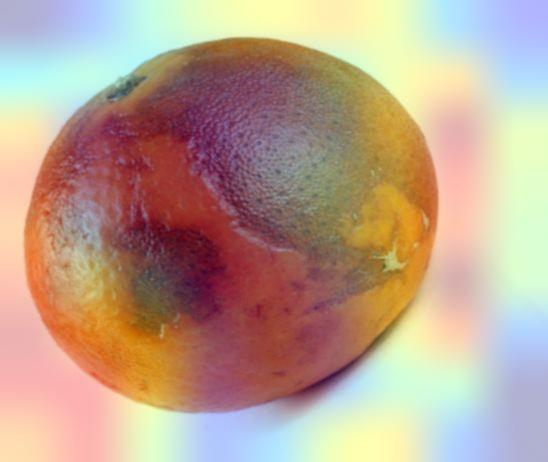

Grad-CAM saved to: /tf/Grad-CAM/Step2/Grad-CAM_65_'Orange_Rotten'_to_'Apple_Rotten'.jpg
Original Image Path : /tf/Fixed_Data/Data_Final/Step2-2/test/Orange_Rotten/aug_Screen Shot 2018-06-12 at 11_de4b7c1f-ac12-489c-95f8-c7e6cc0b728b_0_9988.jpg

real class : Orange_Rotten
predicted class : Mango_Fresh


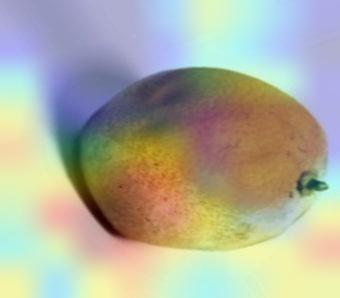

Grad-CAM saved to: /tf/Grad-CAM/Step2/Grad-CAM_66_'Orange_Rotten'_to_'Mango_Fresh'.jpg
Original Image Path : /tf/Fixed_Data/Data_Final/Step2-2/test/Orange_Rotten/aug_Screen Shot 2018-06-12 at 11_eaa8859e-12d9-4a00-8cae-c39980f80773_0_1080.jpg

real class : Orange_Rotten
predicted class : Orange_Fresh


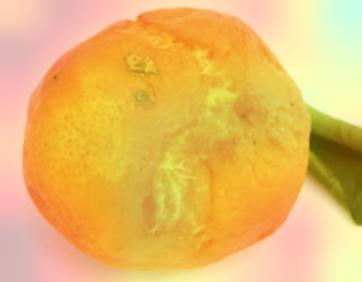

Grad-CAM saved to: /tf/Grad-CAM/Step2/Grad-CAM_67_'Orange_Rotten'_to_'Orange_Fresh'.jpg
Original Image Path : /tf/Fixed_Data/Data_Final/Step2-2/test/Orange_Rotten/original_Screen Shot 2018-06-12 at 11.32.41 PM.png

real class : Orange_Rotten
predicted class : Apple_Rotten


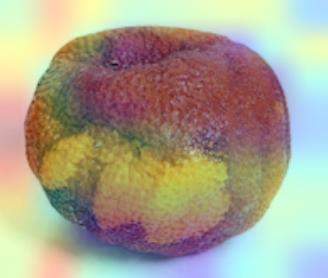

Grad-CAM saved to: /tf/Grad-CAM/Step2/Grad-CAM_68_'Orange_Rotten'_to_'Apple_Rotten'.jpg
Original Image Path : /tf/Fixed_Data/Data_Final/Step2-2/test/Orange_Rotten/original_Screen Shot 2018-06-12 at 11.42.38 PM.png

real class : Pomegranate_Fresh
predicted class : Apple_Fresh


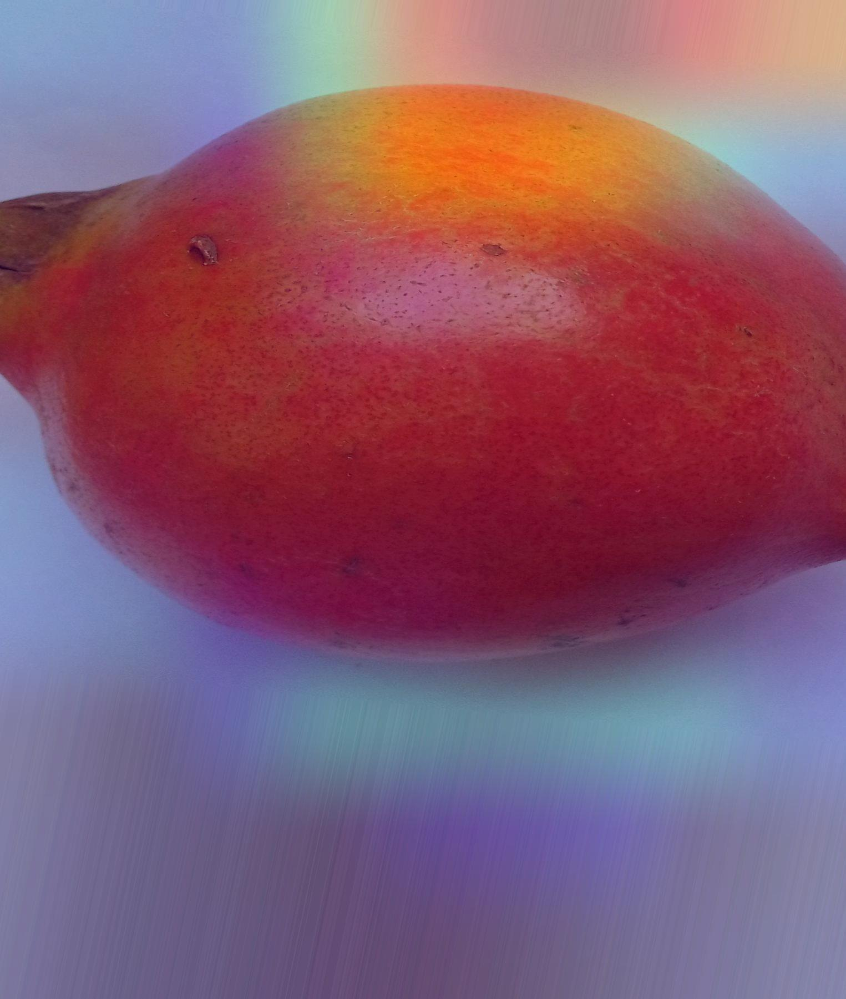

Grad-CAM saved to: /tf/Grad-CAM/Step2/Grad-CAM_69_'Pomegranate_Fresh'_to_'Apple_Fresh'.jpg
Original Image Path : /tf/Fixed_Data/Data_Final/Step2-2/test/Pomegranate_Fresh/aug_FreshPomegranate (10)_4f0ce159-c8ec-411d-a781-e78e270abb9b_0_1915.jpg

real class : Pomegranate_Fresh
predicted class : Orange_Fresh


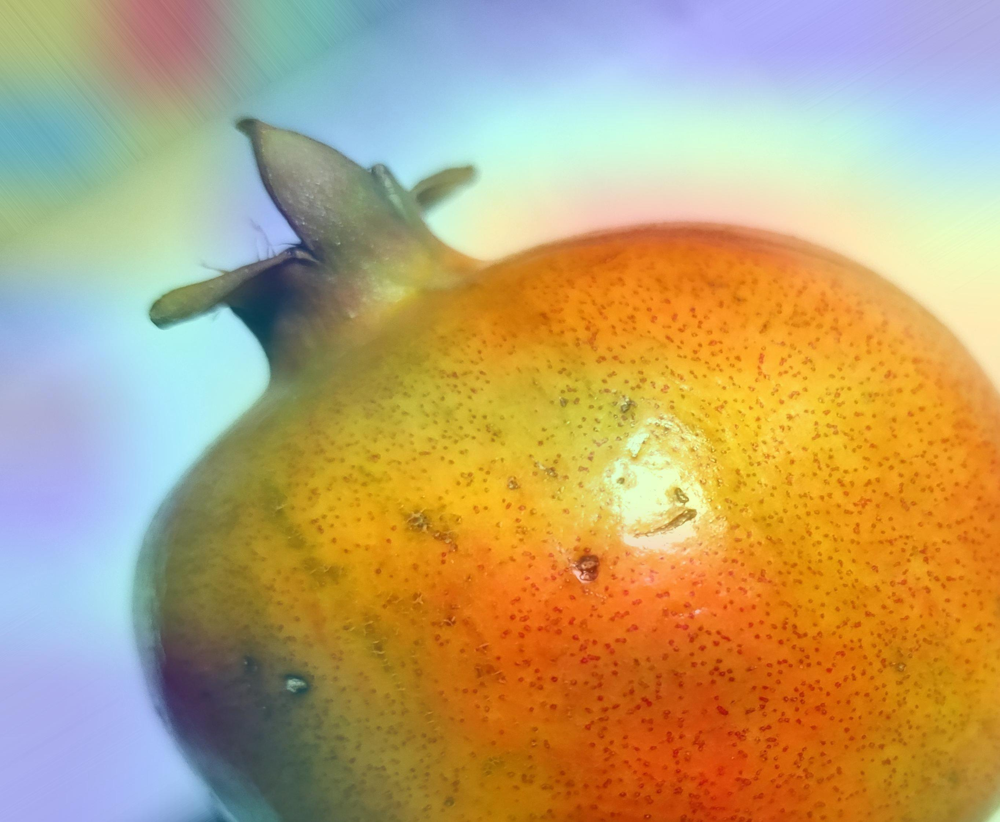

Grad-CAM saved to: /tf/Grad-CAM/Step2/Grad-CAM_70_'Pomegranate_Fresh'_to_'Orange_Fresh'.jpg
Original Image Path : /tf/Fixed_Data/Data_Final/Step2-2/test/Pomegranate_Fresh/aug_FreshPomegranate (61)_4627aba5-9768-481b-898b-8f52f0af1794_0_2994.jpg

real class : Pomegranate_Fresh
predicted class : Mango_Fresh


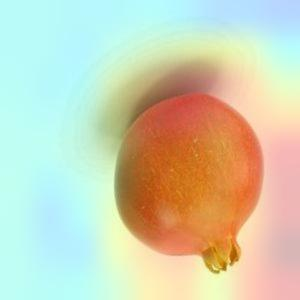

Grad-CAM saved to: /tf/Grad-CAM/Step2/Grad-CAM_71_'Pomegranate_Fresh'_to_'Mango_Fresh'.jpg
Original Image Path : /tf/Fixed_Data/Data_Final/Step2-2/test/Pomegranate_Fresh/aug_fresh_pomegranate_167_6d7b04ef-022d-434a-92da-316fbfa0b40a_0_8516.jpg

real class : Pomegranate_Fresh
predicted class : Pomegranate_Rotten


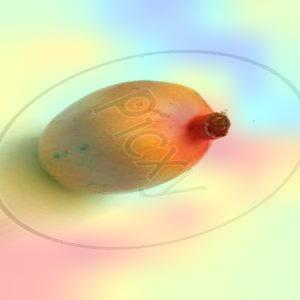

Grad-CAM saved to: /tf/Grad-CAM/Step2/Grad-CAM_72_'Pomegranate_Fresh'_to_'Pomegranate_Rotten'.jpg
Original Image Path : /tf/Fixed_Data/Data_Final/Step2-2/test/Pomegranate_Fresh/aug_fresh_pomegranate_184_3f150852-7fda-42c2-9823-a8244746ccf9_0_6415.jpg

real class : Pomegranate_Fresh
predicted class : Pomegranate_Rotten


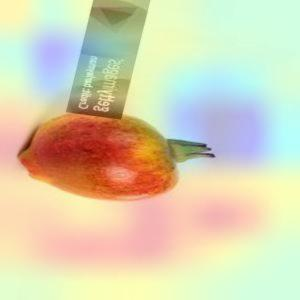

Grad-CAM saved to: /tf/Grad-CAM/Step2/Grad-CAM_73_'Pomegranate_Fresh'_to_'Pomegranate_Rotten'.jpg
Original Image Path : /tf/Fixed_Data/Data_Final/Step2-2/test/Pomegranate_Fresh/aug_fresh_pomegranate_188_554a1482-6383-411f-8e04-d29f5d9a7a14_0_4053.jpg

real class : Pomegranate_Fresh
predicted class : Apple_Fresh


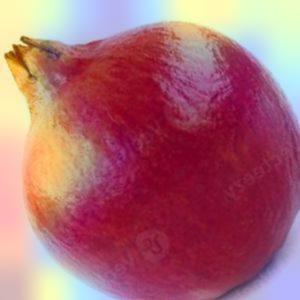

Grad-CAM saved to: /tf/Grad-CAM/Step2/Grad-CAM_74_'Pomegranate_Fresh'_to_'Apple_Fresh'.jpg
Original Image Path : /tf/Fixed_Data/Data_Final/Step2-2/test/Pomegranate_Fresh/aug_fresh_pomegranate_215_e84333e2-f0f7-4404-ac31-0d61fabe5c89_0_8670.jpg

real class : Pomegranate_Fresh
predicted class : Apple_Fresh


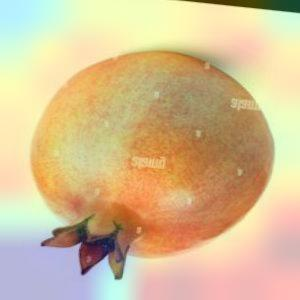

Grad-CAM saved to: /tf/Grad-CAM/Step2/Grad-CAM_75_'Pomegranate_Fresh'_to_'Apple_Fresh'.jpg
Original Image Path : /tf/Fixed_Data/Data_Final/Step2-2/test/Pomegranate_Fresh/aug_fresh_pomegranate_222_f23c0b5a-dcfd-47c7-b361-60f4902786f9_0_8532.jpg

real class : Pomegranate_Fresh
predicted class : Apple_Fresh


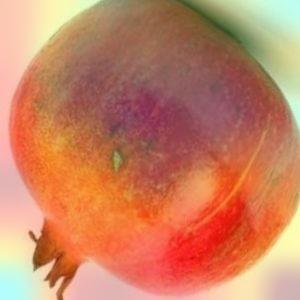

Grad-CAM saved to: /tf/Grad-CAM/Step2/Grad-CAM_76_'Pomegranate_Fresh'_to_'Apple_Fresh'.jpg
Original Image Path : /tf/Fixed_Data/Data_Final/Step2-2/test/Pomegranate_Fresh/aug_fresh_pomegranate_234_13bc6bfa-bbf4-4caa-a98f-01a396986478_0_6191.jpg

real class : Pomegranate_Fresh
predicted class : Apple_Fresh


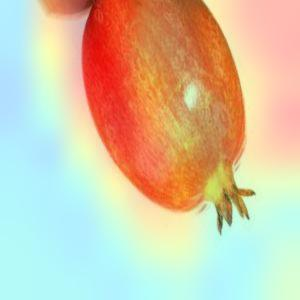

Grad-CAM saved to: /tf/Grad-CAM/Step2/Grad-CAM_77_'Pomegranate_Fresh'_to_'Apple_Fresh'.jpg
Original Image Path : /tf/Fixed_Data/Data_Final/Step2-2/test/Pomegranate_Fresh/aug_fresh_pomegranate_238_02ebec80-6ea5-4744-a17f-0e09278b7e42_0_9089.jpg

real class : Pomegranate_Fresh
predicted class : Apple_Fresh


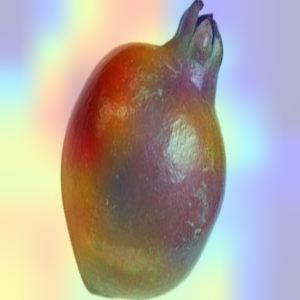

Grad-CAM saved to: /tf/Grad-CAM/Step2/Grad-CAM_78_'Pomegranate_Fresh'_to_'Apple_Fresh'.jpg
Original Image Path : /tf/Fixed_Data/Data_Final/Step2-2/test/Pomegranate_Fresh/aug_fresh_pomegranate_251_c3329ce2-9402-45ed-a075-457e81f95d26_0_8913.jpg

real class : Pomegranate_Fresh
predicted class : Apple_Rotten


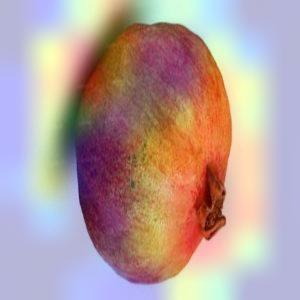

Grad-CAM saved to: /tf/Grad-CAM/Step2/Grad-CAM_79_'Pomegranate_Fresh'_to_'Apple_Rotten'.jpg
Original Image Path : /tf/Fixed_Data/Data_Final/Step2-2/test/Pomegranate_Fresh/aug_fresh_pomegranate_258_896b87df-0c0e-4cb8-8b26-4794c5f3058b_0_9509.jpg

real class : Pomegranate_Fresh
predicted class : Apple_Fresh


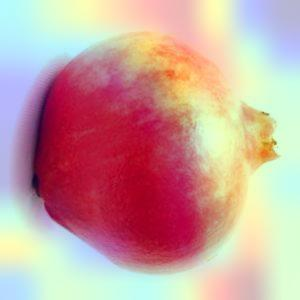

Grad-CAM saved to: /tf/Grad-CAM/Step2/Grad-CAM_80_'Pomegranate_Fresh'_to_'Apple_Fresh'.jpg
Original Image Path : /tf/Fixed_Data/Data_Final/Step2-2/test/Pomegranate_Fresh/aug_fresh_pomegranate_290_5836172c-9e6f-4366-b3a7-e3c1e6cfe51c_0_3131.jpg

real class : Pomegranate_Fresh
predicted class : Apple_Fresh


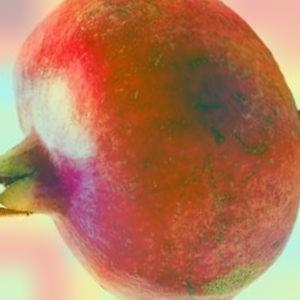

Grad-CAM saved to: /tf/Grad-CAM/Step2/Grad-CAM_81_'Pomegranate_Fresh'_to_'Apple_Fresh'.jpg
Original Image Path : /tf/Fixed_Data/Data_Final/Step2-2/test/Pomegranate_Fresh/aug_fresh_pomegranate_32_0540e96d-6c45-4e31-9866-49bf62830b11_0_5957.jpg

real class : Pomegranate_Rotten
predicted class : Strawberry_Rotten


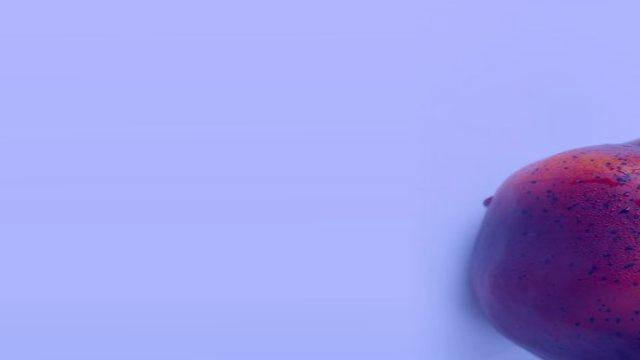

Grad-CAM saved to: /tf/Grad-CAM/Step2/Grad-CAM_82_'Pomegranate_Rotten'_to_'Strawberry_Rotten'.jpg
Original Image Path : /tf/Fixed_Data/Data_Final/Step2-2/test/Pomegranate_Rotten/aug_360_F_367443928_DcpnpfwWCFMZ81ImmwXjhcXDMisDQJQU_jpg_e1a2553a-575e-4efa-acaa-ac0d9d6f7e2e_0_9520.jpg

real class : Pomegranate_Rotten
predicted class : Apple_Rotten


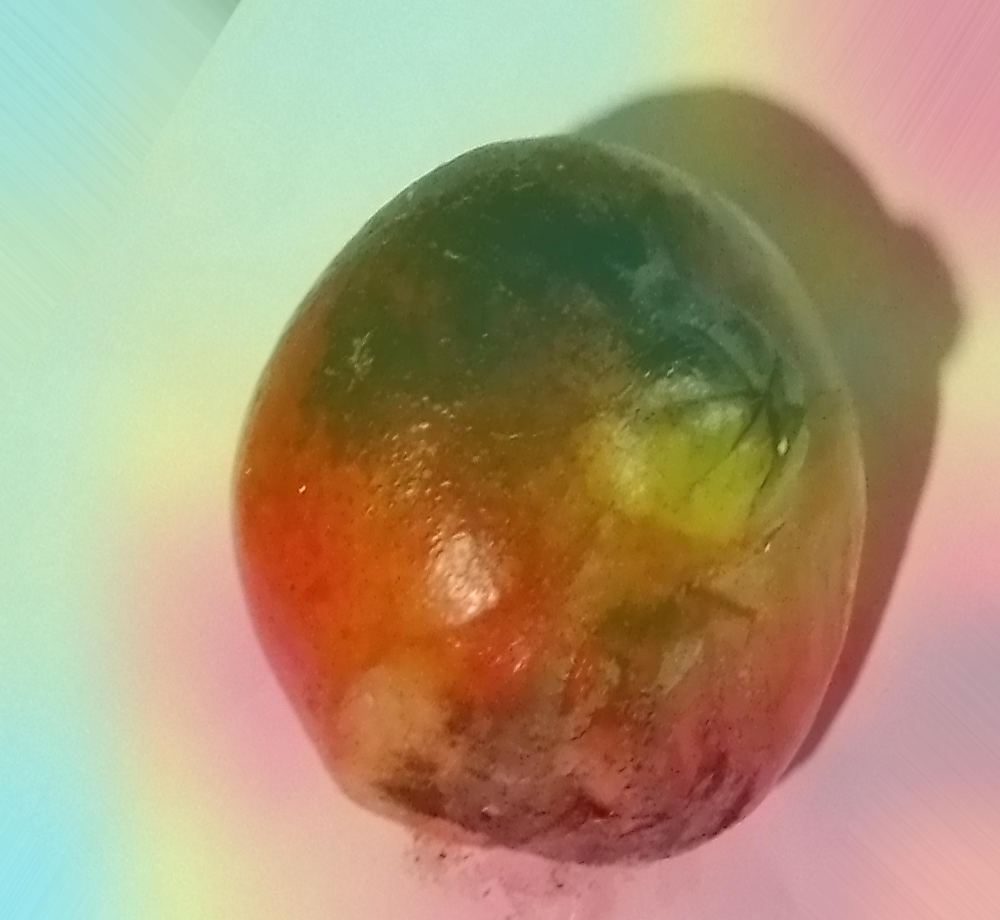

Grad-CAM saved to: /tf/Grad-CAM/Step2/Grad-CAM_83_'Pomegranate_Rotten'_to_'Apple_Rotten'.jpg
Original Image Path : /tf/Fixed_Data/Data_Final/Step2-2/test/Pomegranate_Rotten/aug_RottenPomegranate (175)_7dff4b2b-0879-4d60-92e1-9fa9093be2f7_0_8965.jpg

real class : Pomegranate_Rotten
predicted class : Pomegranate_Fresh


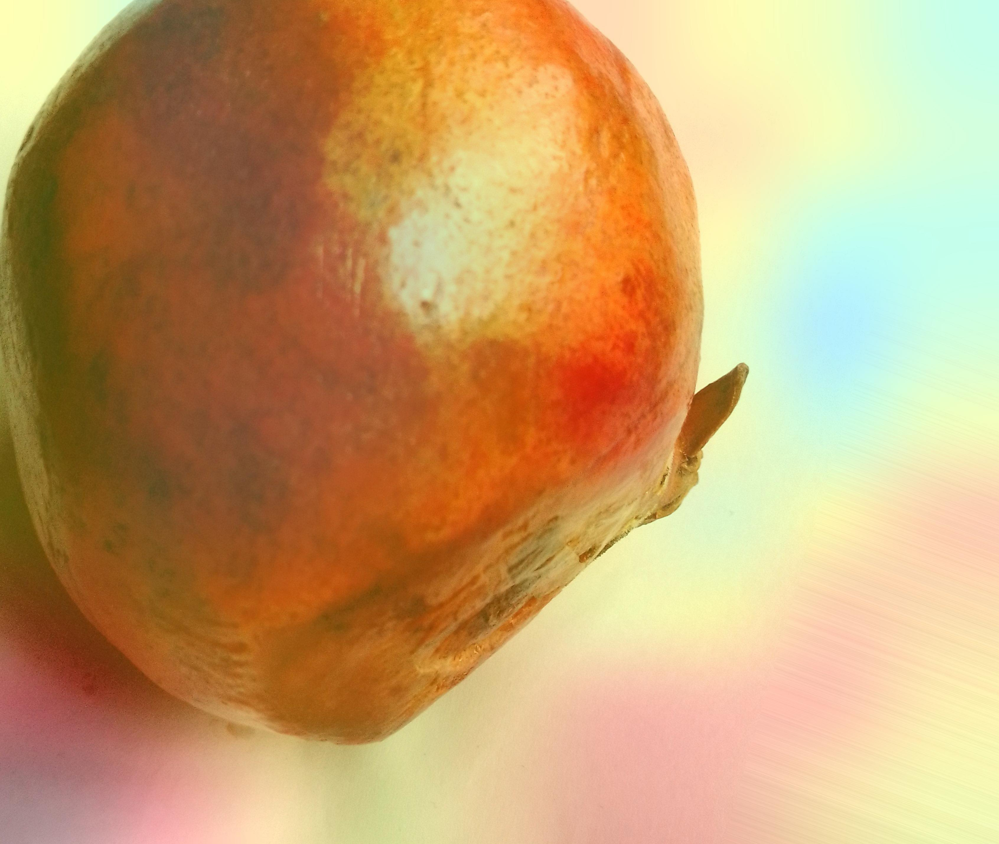

Grad-CAM saved to: /tf/Grad-CAM/Step2/Grad-CAM_84_'Pomegranate_Rotten'_to_'Pomegranate_Fresh'.jpg
Original Image Path : /tf/Fixed_Data/Data_Final/Step2-2/test/Pomegranate_Rotten/aug_RottenPomegranate (79)_29ecf157-b957-4239-ac71-c6db1d39e279_0_1743.jpg

real class : Pomegranate_Rotten
predicted class : Strawberry_Fresh


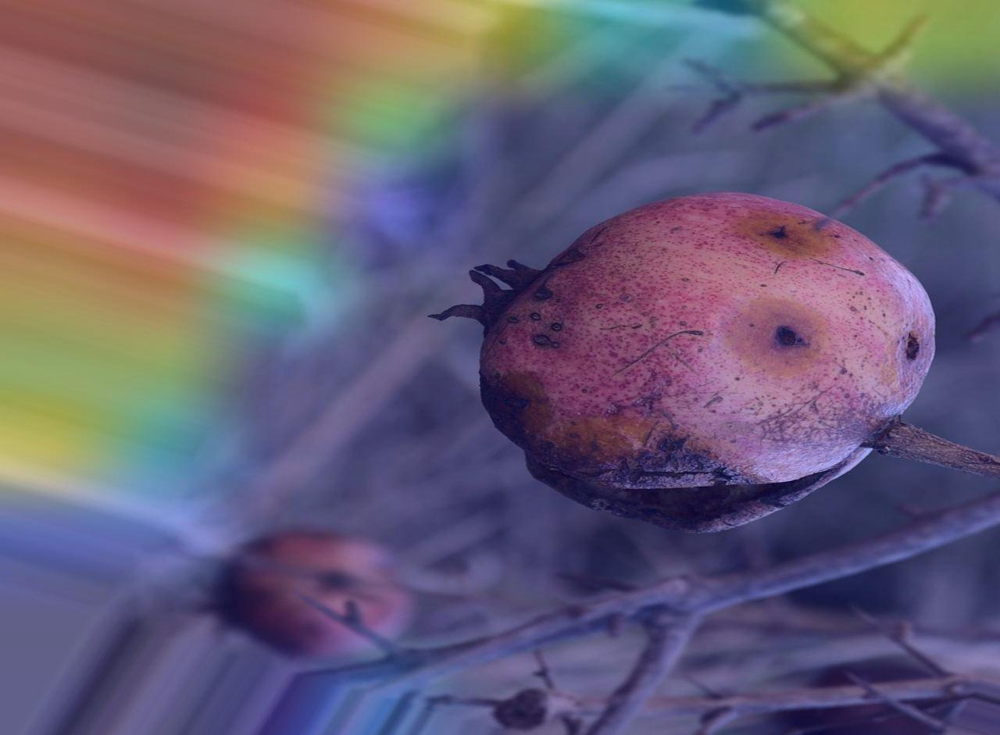

Grad-CAM saved to: /tf/Grad-CAM/Step2/Grad-CAM_85_'Pomegranate_Rotten'_to_'Strawberry_Fresh'.jpg
Original Image Path : /tf/Fixed_Data/Data_Final/Step2-2/test/Pomegranate_Rotten/aug_pomegranate-6940114_1280_jpg_6617f1e3-d63d-49b1-a685-d39cafc34bdd_0_4399.jpg

real class : Pomegranate_Rotten
predicted class : Strawberry_Fresh


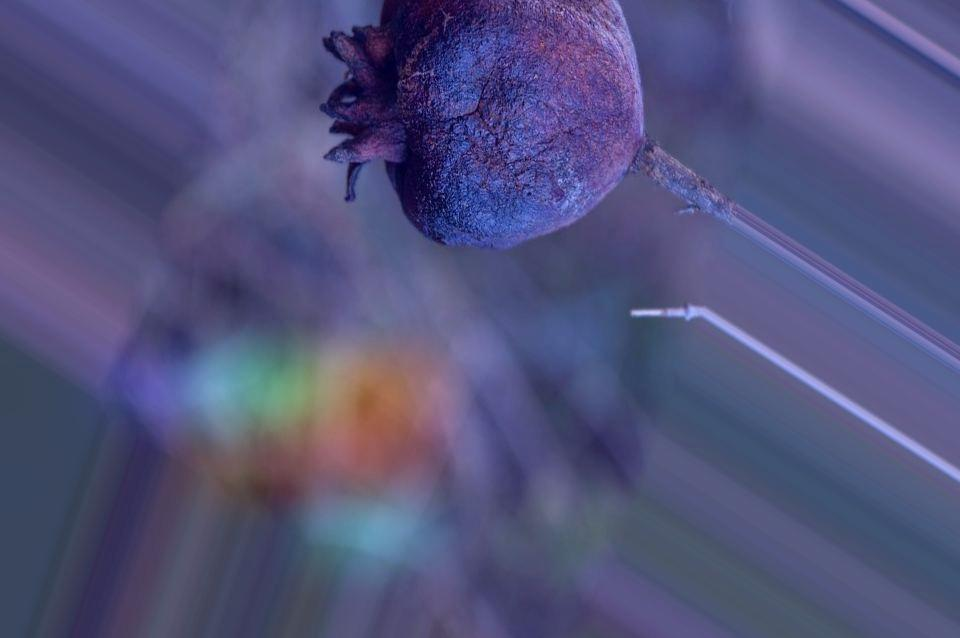

Grad-CAM saved to: /tf/Grad-CAM/Step2/Grad-CAM_86_'Pomegranate_Rotten'_to_'Strawberry_Fresh'.jpg
Original Image Path : /tf/Fixed_Data/Data_Final/Step2-2/test/Pomegranate_Rotten/aug_pomegranate-6940145_960_720_jpg_ab18656f-62a9-49b9-8365-93813f61d6eb_0_3512.jpg

real class : Pomegranate_Rotten
predicted class : Tomato_Fresh


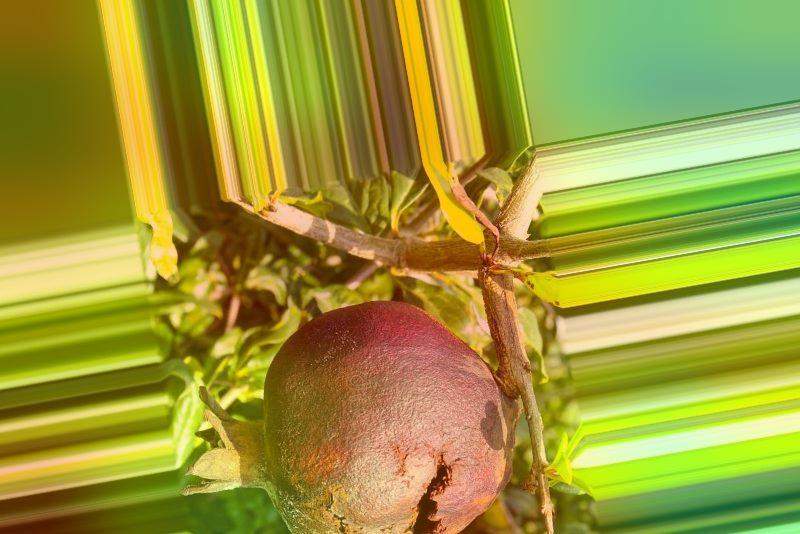

Grad-CAM saved to: /tf/Grad-CAM/Step2/Grad-CAM_87_'Pomegranate_Rotten'_to_'Tomato_Fresh'.jpg
Original Image Path : /tf/Fixed_Data/Data_Final/Step2-2/test/Pomegranate_Rotten/aug_rotten-pomegranate-fruit-pomegranate-plant-rotten-pomegranate-fruit-pomegranate-plant-india-231507826_jpg_317b2aed-ba1e-4a23-b324-be2ea124b6bf_0_4867.jpg

real class : Pomegranate_Rotten
predicted class : Apple_Rotten


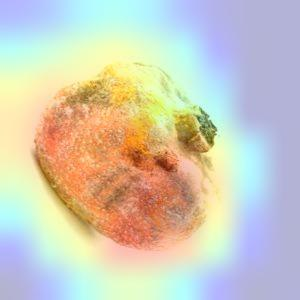

Grad-CAM saved to: /tf/Grad-CAM/Step2/Grad-CAM_88_'Pomegranate_Rotten'_to_'Apple_Rotten'.jpg
Original Image Path : /tf/Fixed_Data/Data_Final/Step2-2/test/Pomegranate_Rotten/aug_rotten_pomegranate_207_0d3bc47a-0863-4a6b-96d7-d1a966f8aa00_0_9493.jpg

real class : Pomegranate_Rotten
predicted class : Tomato_Fresh


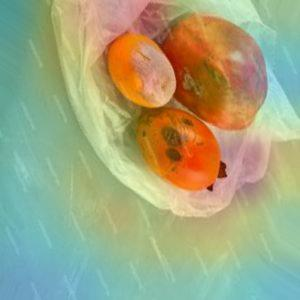

Grad-CAM saved to: /tf/Grad-CAM/Step2/Grad-CAM_89_'Pomegranate_Rotten'_to_'Tomato_Fresh'.jpg
Original Image Path : /tf/Fixed_Data/Data_Final/Step2-2/test/Pomegranate_Rotten/aug_rotten_pomegranate_225_99cfba13-6e8b-497c-a5e2-3f95c4a7db6d_0_1832.jpg

real class : Pomegranate_Rotten
predicted class : Pomegranate_Fresh


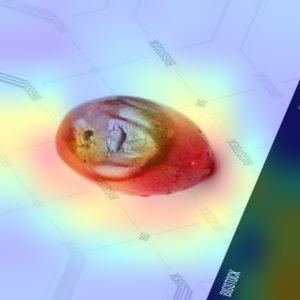

Grad-CAM saved to: /tf/Grad-CAM/Step2/Grad-CAM_90_'Pomegranate_Rotten'_to_'Pomegranate_Fresh'.jpg
Original Image Path : /tf/Fixed_Data/Data_Final/Step2-2/test/Pomegranate_Rotten/aug_rotten_pomegranate_8_024008ef-5e74-478f-9ea8-3f67d58ce5fd_0_5255.jpg

real class : Pomegranate_Rotten
predicted class : Tomato_Rotten


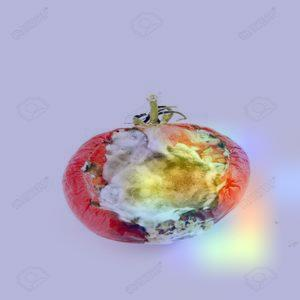

Grad-CAM saved to: /tf/Grad-CAM/Step2/Grad-CAM_91_'Pomegranate_Rotten'_to_'Tomato_Rotten'.jpg
Original Image Path : /tf/Fixed_Data/Data_Final/Step2-2/test/Pomegranate_Rotten/original_rotten_pomegranate_13.jpg

real class : Strawberry_Fresh
predicted class : Tomato_Rotten


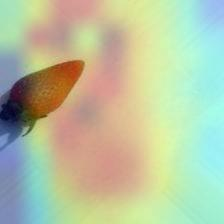

Grad-CAM saved to: /tf/Grad-CAM/Step2/Grad-CAM_92_'Strawberry_Fresh'_to_'Tomato_Rotten'.jpg
Original Image Path : /tf/Fixed_Data/Data_Final/Step2-2/test/Strawberry_Fresh/aug_412_fda4afc2-2a8f-4832-adb1-61061dccdf25_0_3144.jpg

real class : Strawberry_Fresh
predicted class : Strawberry_Rotten


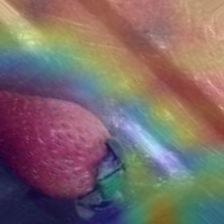

Grad-CAM saved to: /tf/Grad-CAM/Step2/Grad-CAM_93_'Strawberry_Fresh'_to_'Strawberry_Rotten'.jpg
Original Image Path : /tf/Fixed_Data/Data_Final/Step2-2/test/Strawberry_Fresh/aug_761_aa90ab92-ab6b-4534-bf77-01f66232c7dd_0_3140.jpg

real class : Strawberry_Fresh
predicted class : Banana_Rotten


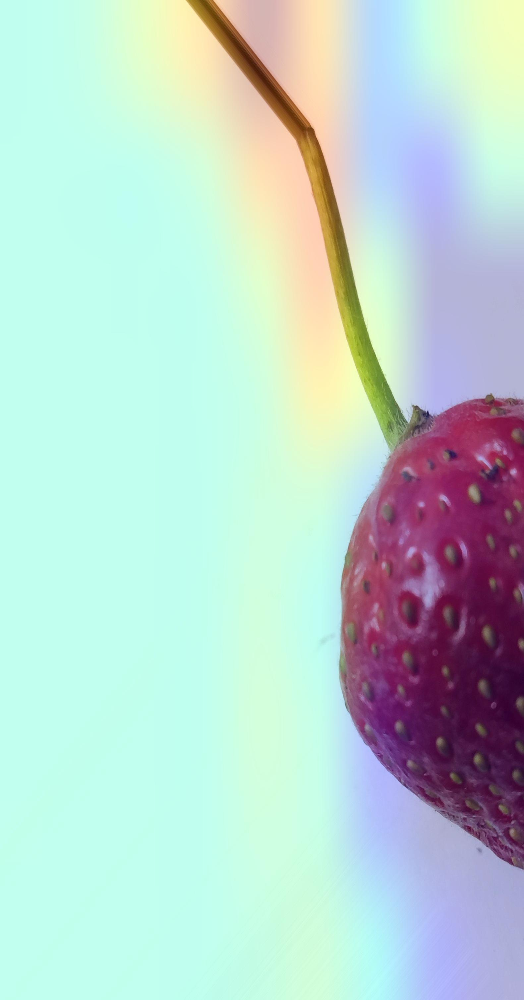

Grad-CAM saved to: /tf/Grad-CAM/Step2/Grad-CAM_94_'Strawberry_Fresh'_to_'Banana_Rotten'.jpg
Original Image Path : /tf/Fixed_Data/Data_Final/Step2-2/test/Strawberry_Fresh/aug_freshStrawberry (32)_1f6389f5-f872-43cc-8052-2de0f82e1c39_0_2473.jpg

real class : Strawberry_Fresh
predicted class : Pomegranate_Rotten


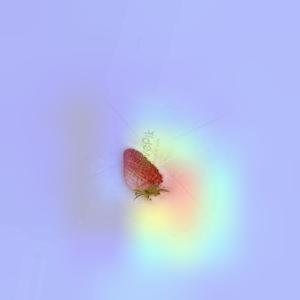

Grad-CAM saved to: /tf/Grad-CAM/Step2/Grad-CAM_95_'Strawberry_Fresh'_to_'Pomegranate_Rotten'.jpg
Original Image Path : /tf/Fixed_Data/Data_Final/Step2-2/test/Strawberry_Fresh/aug_fresh_strawberry_110_ad859f21-494c-490e-a956-9ca33267f972_0_9121.jpg

real class : Strawberry_Rotten
predicted class : Banana_Rotten


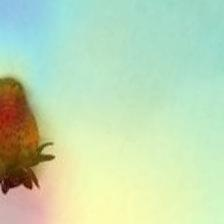

Grad-CAM saved to: /tf/Grad-CAM/Step2/Grad-CAM_96_'Strawberry_Rotten'_to_'Banana_Rotten'.jpg
Original Image Path : /tf/Fixed_Data/Data_Final/Step2-2/test/Strawberry_Rotten/aug_408_00901044-02c4-4e08-9d94-985b9d47d129_0_5676.jpg

real class : Strawberry_Rotten
predicted class : Mango_Rotten


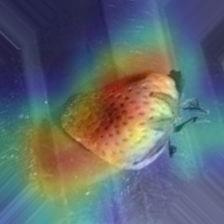

Grad-CAM saved to: /tf/Grad-CAM/Step2/Grad-CAM_97_'Strawberry_Rotten'_to_'Mango_Rotten'.jpg
Original Image Path : /tf/Fixed_Data/Data_Final/Step2-2/test/Strawberry_Rotten/aug_919_fa536285-5b03-4200-843f-b0c9b90d891e_0_5418.jpg

real class : Strawberry_Rotten
predicted class : Apple_Fresh


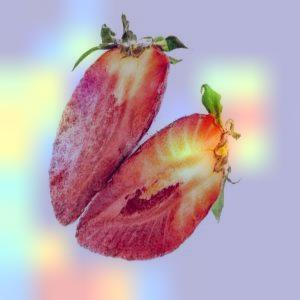

Grad-CAM saved to: /tf/Grad-CAM/Step2/Grad-CAM_98_'Strawberry_Rotten'_to_'Apple_Fresh'.jpg
Original Image Path : /tf/Fixed_Data/Data_Final/Step2-2/test/Strawberry_Rotten/aug_rotten_strawberry_145_dda829e1-b670-4a62-8604-7fc9047d318e_0_212.jpg

real class : Strawberry_Rotten
predicted class : Strawberry_Fresh


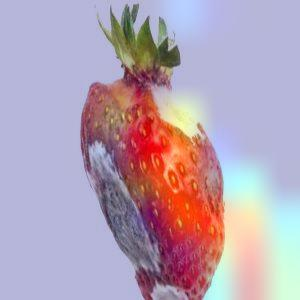

Grad-CAM saved to: /tf/Grad-CAM/Step2/Grad-CAM_99_'Strawberry_Rotten'_to_'Strawberry_Fresh'.jpg
Original Image Path : /tf/Fixed_Data/Data_Final/Step2-2/test/Strawberry_Rotten/aug_rotten_strawberry_291_f6b503de-c001-4752-a4f1-eab1f812aee8_0_7019.jpg

real class : Strawberry_Rotten
predicted class : Tomato_Rotten


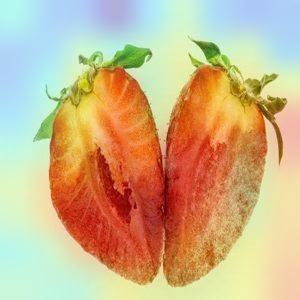

Grad-CAM saved to: /tf/Grad-CAM/Step2/Grad-CAM_100_'Strawberry_Rotten'_to_'Tomato_Rotten'.jpg
Original Image Path : /tf/Fixed_Data/Data_Final/Step2-2/test/Strawberry_Rotten/original_rotten_strawberry_145.jpg

real class : Strawberry_Rotten
predicted class : Tomato_Rotten


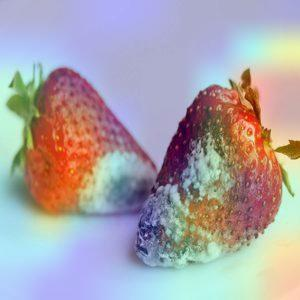

Grad-CAM saved to: /tf/Grad-CAM/Step2/Grad-CAM_101_'Strawberry_Rotten'_to_'Tomato_Rotten'.jpg
Original Image Path : /tf/Fixed_Data/Data_Final/Step2-2/test/Strawberry_Rotten/original_rotten_strawberry_242.jpg

real class : Tomato_Fresh
predicted class : Pomegranate_Rotten


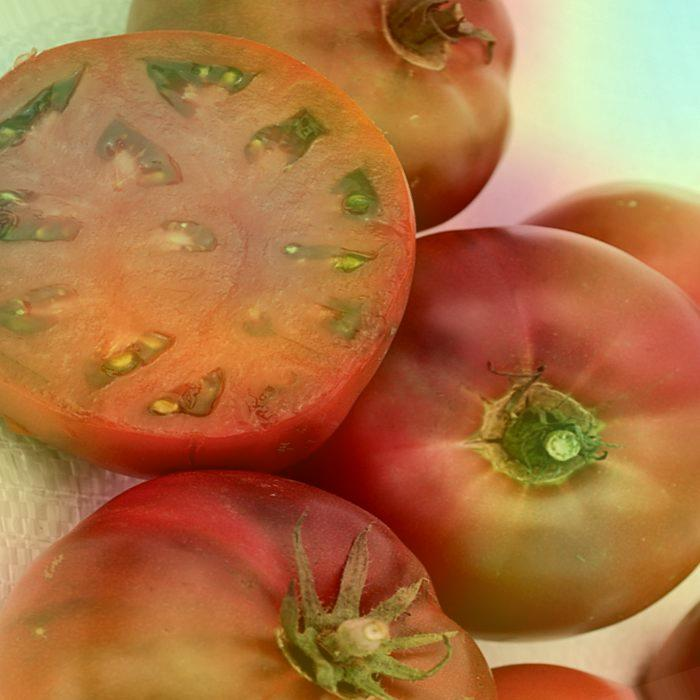

Grad-CAM saved to: /tf/Grad-CAM/Step2/Grad-CAM_102_'Tomato_Fresh'_to_'Pomegranate_Rotten'.jpg
Original Image Path : /tf/Fixed_Data/Data_Final/Step2-2/test/Tomato_Fresh/aug_freshTomato (136)_17cdb441-08a0-4bc4-ae9f-db9b31f229c5_0_2477.jpg

real class : Tomato_Fresh
predicted class : Apple_Fresh


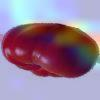

Grad-CAM saved to: /tf/Grad-CAM/Step2/Grad-CAM_103_'Tomato_Fresh'_to_'Apple_Fresh'.jpg
Original Image Path : /tf/Fixed_Data/Data_Final/Step2-2/test/Tomato_Fresh/aug_freshTomato (154)_5dbd9588-5aaa-41c1-b0c8-f773ca90bde0_0_9037.jpg

real class : Tomato_Fresh
predicted class : Apple_Fresh


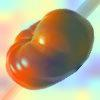

Grad-CAM saved to: /tf/Grad-CAM/Step2/Grad-CAM_104_'Tomato_Fresh'_to_'Apple_Fresh'.jpg
Original Image Path : /tf/Fixed_Data/Data_Final/Step2-2/test/Tomato_Fresh/aug_freshTomato (155)_54cf2939-e5bb-4861-9276-f32019f8973f_0_6215.jpg

real class : Tomato_Fresh
predicted class : Tomato_Rotten


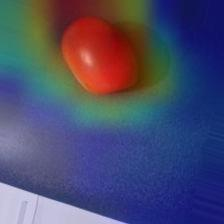

Grad-CAM saved to: /tf/Grad-CAM/Step2/Grad-CAM_105_'Tomato_Fresh'_to_'Tomato_Rotten'.jpg
Original Image Path : /tf/Fixed_Data/Data_Final/Step2-2/test/Tomato_Fresh/aug_freshTomato (166)_db97a436-a681-4519-b248-861d4e194db4_0_8193.jpg

real class : Tomato_Fresh
predicted class : Mango_Rotten


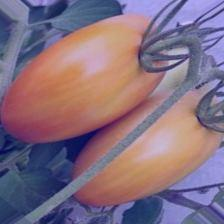

Grad-CAM saved to: /tf/Grad-CAM/Step2/Grad-CAM_106_'Tomato_Fresh'_to_'Mango_Rotten'.jpg
Original Image Path : /tf/Fixed_Data/Data_Final/Step2-2/test/Tomato_Fresh/aug_freshTomato (222)_3306b753-d9fd-4c5c-834e-057ca37df9bb_0_7424.jpg

real class : Tomato_Rotten
predicted class : Apple_Fresh


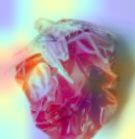

Grad-CAM saved to: /tf/Grad-CAM/Step2/Grad-CAM_107_'Tomato_Rotten'_to_'Apple_Fresh'.jpg
Original Image Path : /tf/Fixed_Data/Data_Final/Step2-2/test/Tomato_Rotten/aug_rottenTomato (104)_b1d10342-ac39-4c72-9477-80487840633a_0_1536.jpg

real class : Tomato_Rotten
predicted class : Pomegranate_Rotten


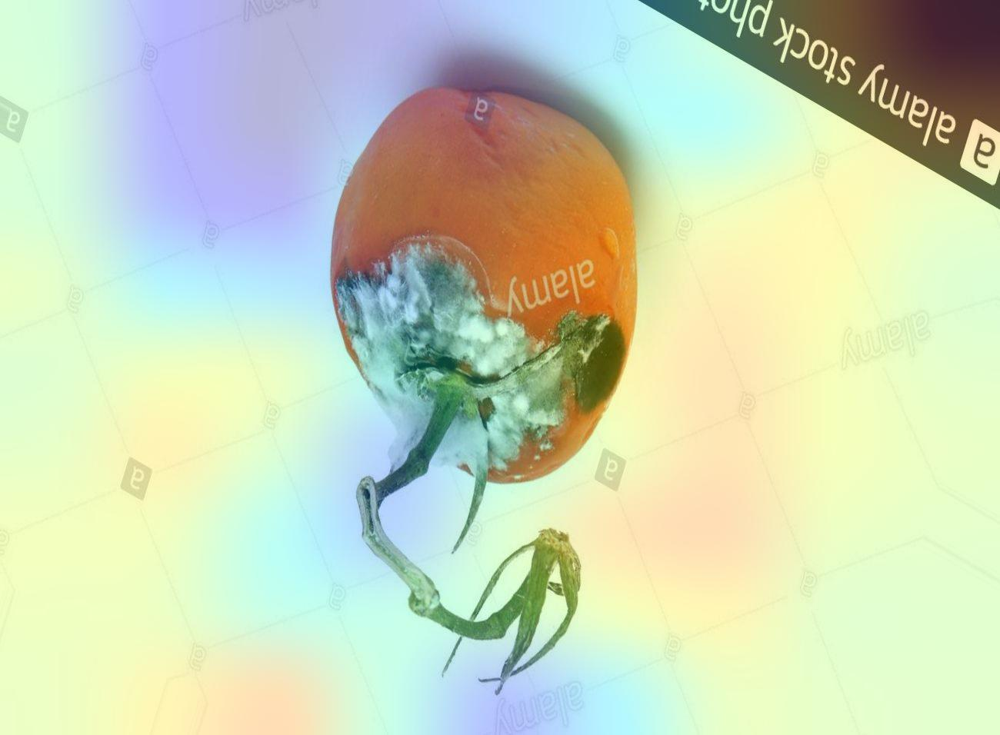

Grad-CAM saved to: /tf/Grad-CAM/Step2/Grad-CAM_108_'Tomato_Rotten'_to_'Pomegranate_Rotten'.jpg
Original Image Path : /tf/Fixed_Data/Data_Final/Step2-2/test/Tomato_Rotten/aug_rottenTomato (11)_008c6588-6c74-4639-95b7-64bc4cec2412_0_5988.jpg

real class : Tomato_Rotten
predicted class : Orange_Rotten


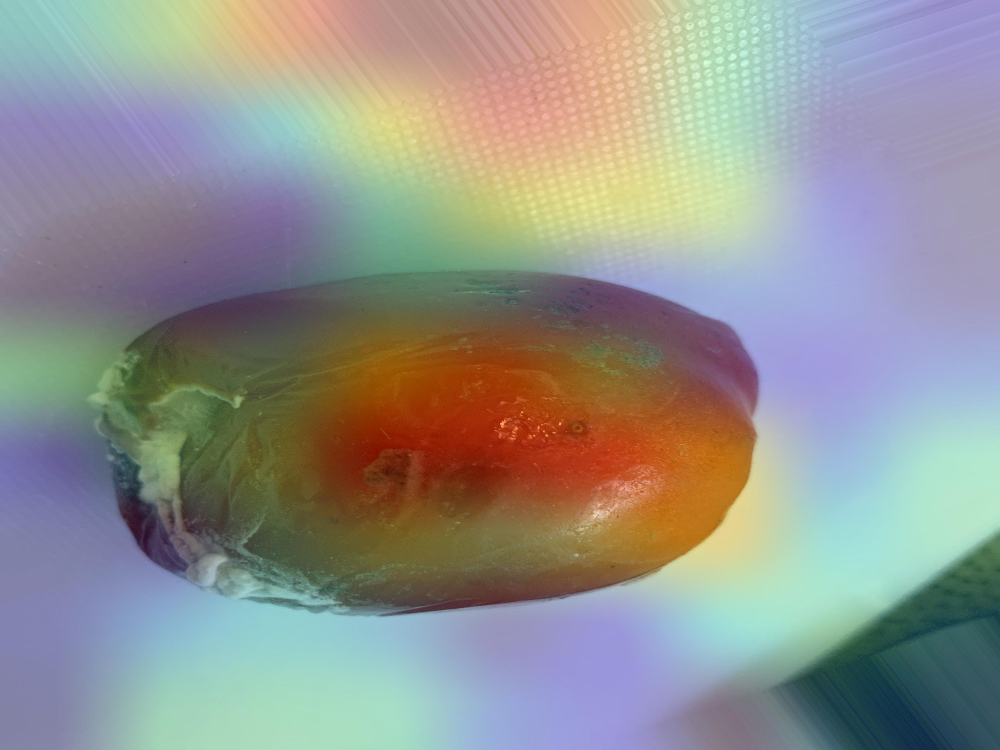

Grad-CAM saved to: /tf/Grad-CAM/Step2/Grad-CAM_109_'Tomato_Rotten'_to_'Orange_Rotten'.jpg
Original Image Path : /tf/Fixed_Data/Data_Final/Step2-2/test/Tomato_Rotten/aug_rottenTomato (154)_9566812e-0966-4307-8529-ffb98d6cbeb0_0_1692.jpg

real class : Tomato_Rotten
predicted class : Pomegranate_Rotten


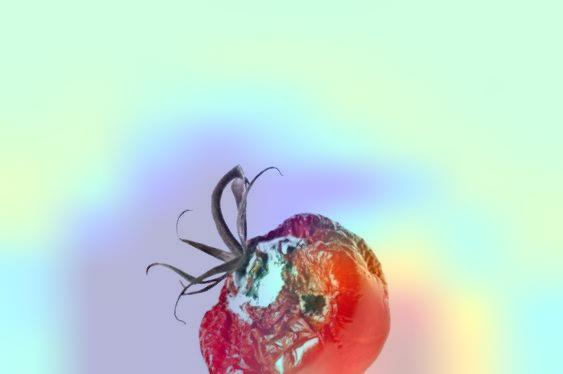

Grad-CAM saved to: /tf/Grad-CAM/Step2/Grad-CAM_110_'Tomato_Rotten'_to_'Pomegranate_Rotten'.jpg
Original Image Path : /tf/Fixed_Data/Data_Final/Step2-2/test/Tomato_Rotten/aug_rottenTomato (222)_da9f616d-3a72-4c94-8080-ff0211f2b835_0_6777.jpg

real class : Tomato_Rotten
predicted class : Pomegranate_Rotten


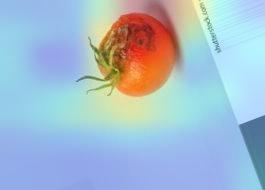

Grad-CAM saved to: /tf/Grad-CAM/Step2/Grad-CAM_111_'Tomato_Rotten'_to_'Pomegranate_Rotten'.jpg
Original Image Path : /tf/Fixed_Data/Data_Final/Step2-2/test/Tomato_Rotten/aug_rottenTomato (50)_a61dc69b-3173-4204-a02e-382c134323a7_0_371.jpg

real class : Tomato_Rotten
predicted class : Tomato_Fresh


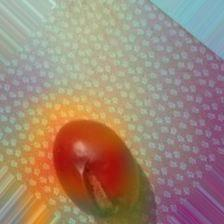

Grad-CAM saved to: /tf/Grad-CAM/Step2/Grad-CAM_112_'Tomato_Rotten'_to_'Tomato_Fresh'.jpg
Original Image Path : /tf/Fixed_Data/Data_Final/Step2-2/test/Tomato_Rotten/aug_rottenTomato (547)_12beac46-6b82-49f8-bc86-dd1c8a2c6baa_0_1299.jpg

real class : Tomato_Rotten
predicted class : Strawberry_Fresh


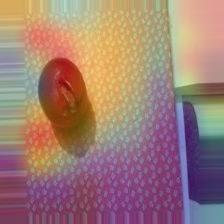

Grad-CAM saved to: /tf/Grad-CAM/Step2/Grad-CAM_113_'Tomato_Rotten'_to_'Strawberry_Fresh'.jpg
Original Image Path : /tf/Fixed_Data/Data_Final/Step2-2/test/Tomato_Rotten/aug_rottenTomato (551)_ed3ae4c8-dd1c-4e02-becc-8dabc03c175c_0_3456.jpg

real class : Tomato_Rotten
predicted class : Mango_Rotten


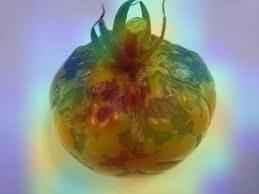

Grad-CAM saved to: /tf/Grad-CAM/Step2/Grad-CAM_114_'Tomato_Rotten'_to_'Mango_Rotten'.jpg
Original Image Path : /tf/Fixed_Data/Data_Final/Step2-2/test/Tomato_Rotten/original_rottenTomato (38).jpg

real class : Tomato_Rotten
predicted class : Tomato_Fresh


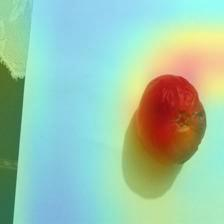

Grad-CAM saved to: /tf/Grad-CAM/Step2/Grad-CAM_115_'Tomato_Rotten'_to_'Tomato_Fresh'.jpg
Original Image Path : /tf/Fixed_Data/Data_Final/Step2-2/test/Tomato_Rotten/original_rottenTomato (436).jpg

real class : Tomato_Rotten
predicted class : Tomato_Fresh


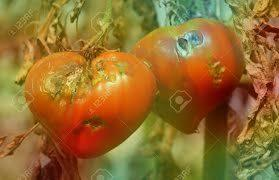

Grad-CAM saved to: /tf/Grad-CAM/Step2/Grad-CAM_116_'Tomato_Rotten'_to_'Tomato_Fresh'.jpg
Original Image Path : /tf/Fixed_Data/Data_Final/Step2-2/test/Tomato_Rotten/original_rottenTomato (48).jpg

real class : Tomato_Rotten
predicted class : Pomegranate_Rotten


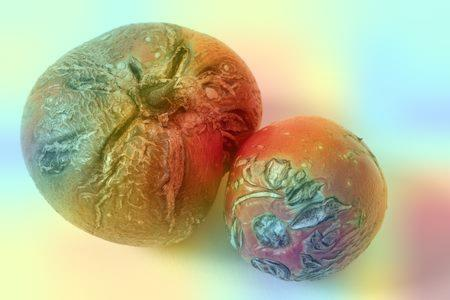

Grad-CAM saved to: /tf/Grad-CAM/Step2/Grad-CAM_117_'Tomato_Rotten'_to_'Pomegranate_Rotten'.jpg
Original Image Path : /tf/Fixed_Data/Data_Final/Step2-2/test/Tomato_Rotten/original_rottenTomato (7).jpg



In [26]:
idx = 0

for i in range(len(incorrect_idx)):
    
    img_path = incorrect_files[i]
    idx = incorrect_idx[i]
    
    # Prepare image
    img_array = get_img_array(img_path, size=image_size)

    # Remove last layer's sigmoid
    model.layers[-1].activation = None
    
    # Print what the real class is
    real = true_labels[idx]
    real = labels[real]
    print(f"real class : {real}")

    # Print what the top predicted class is
    pred = predictions[idx]
    pred = labels[pred]
    print(f"predicted class : {pred}")

    # Generate class activation heatmap
    heatmap = make_gradcam_heatmap(img_array, model, last_conv_layer_name)
    
    cam_path = os.path.join(save_dir, f'Grad-CAM_{i}_\'{real}\'_to_\'{pred}\'.jpg')
    save_and_display_gradcam(img_path, heatmap, cam_path)
    print(f"Original Image Path : {img_path}")
    
    print()
    i += 1

# Analysis


## 청과물 분류
- Apple vs Orange vs Pomegranate vs Tomato  
비슷한 형태의 청과물의 분류에서 성능이 낮은 편  

<br>

## 신선도 판별
- Lemon, Mango  
이미지 데이터에서 Fresh와 Stale이 극명하지 않은 데이터가 존재  
- Orange  
일부 껍질이 까져있는 형태의 오렌지의 경우 신선도를 제대로 판별하지 못함

<br>

## 기타
- Apple_Rotten vs Banana_Fresh  
썩은 노란 사과를 신선한 바나나로 판별